## Week3
### 가설 세우기
1. 음주 여부는 건강검진 수치와 차이가 있을까?
2. 신장/허리둘레의 크기가 체중과 상관관계가 있을까?

In [2]:
import pandas as pd  # 데이터 분석용 라이브러리
import numpy as np  # 수치 계산 라이브러리
import seaborn as sns  # matplotlib을 사용하기 쉽게 만든 시각화 라이브러리
import matplotlib.pyplot as plt  # 그래프의 폰트 바꾸기, 스타일 변경, 사이즈 조정, 서브 플롯 사용을 위해 로드하는 라이브러리.

# 그래프 표시
%matplotlib inline  

# 한글폰트 설정
import os
if os.name == 'posix':
    plt.rc("font", family="AppleGothic")
else:
    plt.rc("font", family="Malgun Gothic")
plt.rc("axes", unicode_minus=False)

# 레티나 설정 (글씨가 흐릿하게 보이는 현상을 막기 위함)
%config InlineBackend.figure_format = 'retina'

In [3]:
# pd.read_ 까지 입력하여 tab키를 누르면 불러올 수 있는 다양한 형태의 데이터를 확인할 수 있음
df = pd.read_csv("data/NHIS_OPEN_GJ_2017.csv", encoding="cp949")
df.shape

(1000000, 34)

In [4]:
# 위에서부터 다섯개의 행 가져옴
df.head()

,기준년도,가입자일련번호,성별코드,연령대코드(5세단위),시도코드,신장(5Cm단위),체중(5Kg 단위),허리둘레,시력(좌),시력(우),...,감마지티피,흡연상태,음주여부,구강검진 수검여부,치아우식증유무,결손치유무,치아마모증유무,제3대구치(사랑니)이상,치석,데이터공개일자
0,2017,1,1,13,46,170.0,65.0,91.0,1.0,1.2,...,25.0,3.0,0.0,1,NaN,NaN,NaN,NaN,1.0,20181126
1,2017,2,2,8,41,150.0,45.0,73.4,1.2,1.0,...,10.0,1.0,0.0,1,NaN,NaN,NaN,NaN,1.0,20181126
2,2017,3,1,8,45,175.0,75.0,94.0,1.0,0.8,...,136.0,1.0,0.0,1,NaN,NaN,NaN,NaN,0.0,20181126
3,2017,4,2,12,11,155.0,55.0,67.5,0.9,1.0,...,30.0,1.0,1.0,0,NaN,NaN,NaN,NaN,NaN,20181126
4,2017,5,1,8,41,175.0,75.0,93.0,1.5,1.5,...,68.0,3.0,0.0,0,NaN,NaN,NaN,NaN,NaN,20181126


In [5]:
# 아래에서부터  다섯개의 행 가져옴
df.tail()

,기준년도,가입자일련번호,성별코드,연령대코드(5세단위),시도코드,신장(5Cm단위),체중(5Kg 단위),허리둘레,시력(좌),시력(우),...,감마지티피,흡연상태,음주여부,구강검진 수검여부,치아우식증유무,결손치유무,치아마모증유무,제3대구치(사랑니)이상,치석,데이터공개일자
999995,2017,999996,2,9,41,165.0,55.0,70.0,1.5,1.5,...,11.0,1.0,1.0,0,NaN,NaN,NaN,NaN,NaN,20181126
999996,2017,999997,2,9,11,165.0,50.0,68.0,1.2,1.5,...,11.0,1.0,0.0,1,NaN,NaN,NaN,NaN,0.0,20181126
999997,2017,999998,2,12,27,155.0,50.0,83.8,0.2,1.0,...,12.0,1.0,0.0,1,NaN,NaN,NaN,NaN,0.0,20181126
999998,2017,999999,1,11,47,160.0,70.0,99.0,0.8,0.9,...,35.0,2.0,1.0,0,NaN,NaN,NaN,NaN,NaN,20181126
999999,2017,1000000,2,9,27,165.0,60.0,74.0,1.2,1.2,...,15.0,1.0,0.0,0,NaN,NaN,NaN,NaN,NaN,20181126


In [6]:
# 랜덤으로 하나의 행 가져옴
df.sample()

,기준년도,가입자일련번호,성별코드,연령대코드(5세단위),시도코드,신장(5Cm단위),체중(5Kg 단위),허리둘레,시력(좌),시력(우),...,감마지티피,흡연상태,음주여부,구강검진 수검여부,치아우식증유무,결손치유무,치아마모증유무,제3대구치(사랑니)이상,치석,데이터공개일자
365672,2017,365673,2,9,27,165.0,55.0,71.0,1.0,0.7,...,8.0,1.0,1.0,0,NaN,NaN,NaN,NaN,NaN,20181126


In [7]:
# 데이터의 크기, 형식, 메모리 사용량
# 100만개 이하의 데이터: 결측치 있음
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000000 entries, 0 to 999999
Data columns (total 34 columns):
 #   Column        Non-Null Count    Dtype  
---  ------        --------------    -----  
 0   기준년도          1000000 non-null  int64  
 1   가입자일련번호       1000000 non-null  int64  
 2   성별코드          1000000 non-null  int64  
 3   연령대코드(5세단위)   1000000 non-null  int64  
 4   시도코드          1000000 non-null  int64  
 5   신장(5Cm단위)     999738 non-null   float64
 6   체중(5Kg 단위)    999732 non-null   float64
 7   허리둘레          999560 non-null   float64
 8   시력(좌)         999712 non-null   float64
 9   시력(우)         999721 non-null   float64
 10  청력(좌)         999758 non-null   float64
 11  청력(우)         999757 non-null   float64
 12  수축기혈압         999924 non-null   float64
 13  이완기혈압         999923 non-null   float64
 14  식전혈당(공복혈당)    999957 non-null   float64
 15  총콜레스테롤        999957 non-null   float64
 16  트리글리세라이드      999957 non-null   float64
 17  HDL콜레스테롤      999956 non-nul

In [8]:
# 열의 이름 
df.columns

Index(['기준년도', '가입자일련번호', '성별코드', '연령대코드(5세단위)', '시도코드', '신장(5Cm단위)',
       '체중(5Kg 단위)', '허리둘레', '시력(좌)', '시력(우)', '청력(좌)', '청력(우)', '수축기혈압',
       '이완기혈압', '식전혈당(공복혈당)', '총콜레스테롤', '트리글리세라이드', 'HDL콜레스테롤', 'LDL콜레스테롤',
       '혈색소', '요단백', '혈청크레아티닌', '(혈청지오티)AST', '(혈청지오티)ALT', '감마지티피', '흡연상태',
       '음주여부', '구강검진 수검여부', '치아우식증유무', '결손치유무', '치아마모증유무', '제3대구치(사랑니)이상',
       '치석', '데이터공개일자'],
      dtype='object')

In [9]:
# 각각의 열의 데이터 타입
df.dtypes

기준년도              int64
가입자일련번호           int64
성별코드              int64
연령대코드(5세단위)       int64
시도코드              int64
신장(5Cm단위)       float64
체중(5Kg 단위)      float64
허리둘레            float64
시력(좌)           float64
시력(우)           float64
청력(좌)           float64
청력(우)           float64
수축기혈압           float64
이완기혈압           float64
식전혈당(공복혈당)      float64
총콜레스테롤          float64
트리글리세라이드        float64
HDL콜레스테롤        float64
LDL콜레스테롤        float64
혈색소             float64
요단백             float64
혈청크레아티닌         float64
(혈청지오티)AST      float64
(혈청지오티)ALT      float64
감마지티피           float64
흡연상태            float64
음주여부            float64
구강검진 수검여부         int64
치아우식증유무         float64
결손치유무           float64
치아마모증유무         float64
제3대구치(사랑니)이상    float64
치석              float64
데이터공개일자           int64
dtype: object

### 결측치 보고 요약, 집계하기

In [11]:
# 결측치 수 집계
df.isnull().sum()

기준년도                  0
가입자일련번호               0
성별코드                  0
연령대코드(5세단위)           0
시도코드                  0
신장(5Cm단위)           262
체중(5Kg 단위)          268
허리둘레                440
시력(좌)               288
시력(우)               279
청력(좌)               242
청력(우)               243
수축기혈압                76
이완기혈압                77
식전혈당(공복혈당)           43
총콜레스테롤               43
트리글리세라이드             43
HDL콜레스테롤             44
LDL콜레스테롤           2899
혈색소                  56
요단백                4859
혈청크레아티닌              44
(혈청지오티)AST           42
(혈청지오티)ALT           44
감마지티피                45
흡연상태                160
음주여부                525
구강검진 수검여부             0
치아우식증유무         1000000
결손치유무           1000000
치아마모증유무         1000000
제3대구치(사랑니)이상    1000000
치석               601252
데이터공개일자               0
dtype: int64

<Axes: >

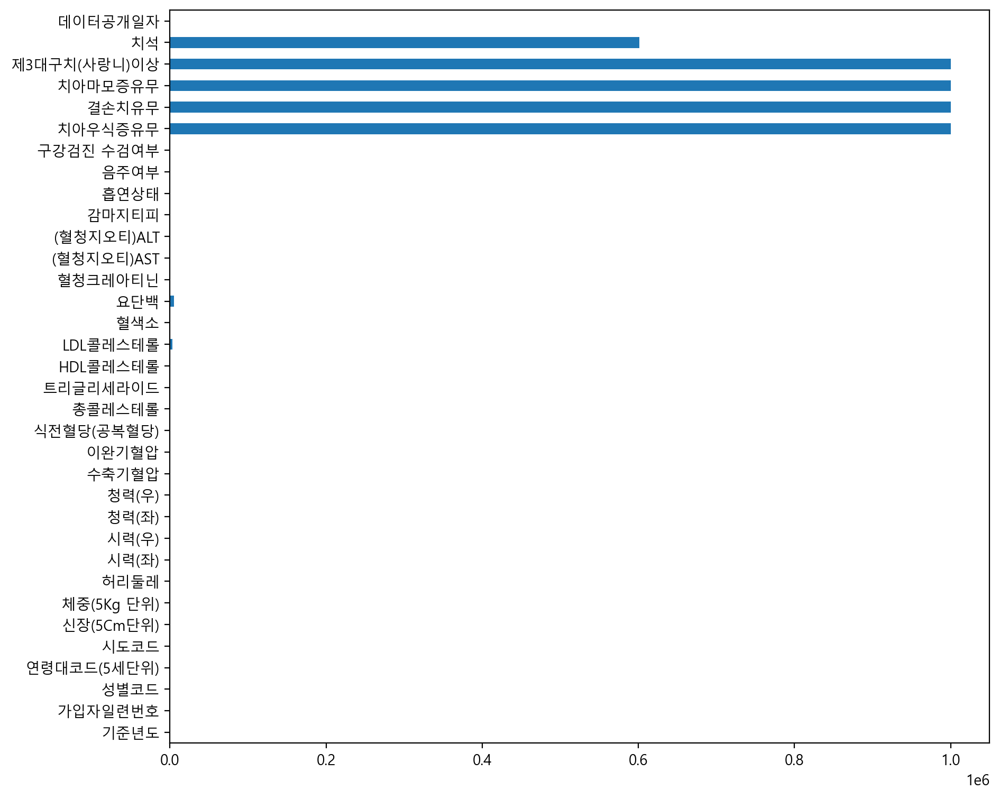

In [12]:
# plot 이용해 막대그래프로 시각화
df.isnull().sum().plot.barh(figsize=(10, 9))

In [13]:
# 일부 데이터 요약하기 (series 형태)
df["(혈청지오티)ALT"]

0         41.0
1         13.0
2         62.0
3         24.0
4         62.0
          ... 
999995    11.0
999996    11.0
999997    13.0
999998    30.0
999999    20.0
Name: (혈청지오티)ALT, Length: 1000000, dtype: float64

In [14]:
# 두개 이상의 열 가져오기 (dataframe 형태)
df[["(혈청지오티)ALT", "(혈청지오티)AST"]]

,(혈청지오티)ALT,(혈청지오티)AST
0,41.0,19.0
1,13.0,16.0
2,62.0,45.0
3,24.0,21.0
4,62.0,37.0
...,...,...
999995,11.0,18.0
999996,11.0,21.0
999997,13.0,23.0
999998,30.0,28.0


In [15]:
# describe(): 수치 데이터 요약
df[["(혈청지오티)ALT", "(혈청지오티)AST"]].describe()

,(혈청지오티)ALT,(혈청지오티)AST
count,999956.000000,999958.000000
mean,25.859343,26.075068
std,25.814268,24.437136
min,1.000000,1.000000
25%,15.000000,19.000000
50%,20.000000,23.000000
75%,30.000000,28.000000
max,6710.000000,9999.000000


In [16]:
# 성별코드의 데이터 빈도수 체크
df["성별코드"].value_counts()

성별코드
1    531172
2    468828
Name: count, dtype: int64

In [17]:
# 1: 피우지 않는다, 2: 이전에 피웠으나 끊었다, 3: 현재도 피우고 있다
df["흡연상태"].value_counts()

흡연상태
1.0    608587
3.0    215061
2.0    176192
Name: count, dtype: int64

### groupBy와 pivot_table로 다양한 집계연산 하기

In [19]:
# 성별코드에 따른 모든 열에 대한 평균
df.groupby(["성별코드"]).mean()

,기준년도,가입자일련번호,연령대코드(5세단위),시도코드,신장(5Cm단위),체중(5Kg 단위),허리둘레,시력(좌),시력(우),청력(좌),...,감마지티피,흡연상태,음주여부,구강검진 수검여부,치아우식증유무,결손치유무,치아마모증유무,제3대구치(사랑니)이상,치석,데이터공개일자
성별코드,,,,,,,,,,,,,,,,,,,,,
1,2017.0,499946.580386,10.324381,34.15184,168.516441,70.211016,85.171843,1.035268,1.034448,1.032813,...,49.446249,2.058548,0.670136,0.433298,NaN,NaN,NaN,NaN,0.640683,20181126.0
2,2017.0,500061.589758,10.783424,33.25853,155.078899,55.701656,77.061441,0.915023,0.910340,1.031968,...,23.396111,1.094082,0.300790,0.359603,NaN,NaN,NaN,NaN,0.549563,20181126.0


In [20]:
# 성별코드에 따른 모든 열의 데이터 개수
df.groupby(["성별코드"]).count()

,기준년도,가입자일련번호,연령대코드(5세단위),시도코드,신장(5Cm단위),체중(5Kg 단위),허리둘레,시력(좌),시력(우),청력(좌),...,감마지티피,흡연상태,음주여부,구강검진 수검여부,치아우식증유무,결손치유무,치아마모증유무,제3대구치(사랑니)이상,치석,데이터공개일자
성별코드,,,,,,,,,,,,,,,,,,,,,
1,531172,531172,531172,531172,531098,531098,531102,531047,531055,531064,...,531154,531120,530976,531172,0,0,0,0,230156,531172
2,468828,468828,468828,468828,468640,468634,468458,468665,468666,468694,...,468801,468720,468499,468828,0,0,0,0,168592,468828


In [21]:
# 성별코드에 따른 음주상태 알아보기
df.groupby(["성별코드", "음주여부"])["가입자일련번호"].count()

성별코드  음주여부
1     0.0     175150
      1.0     355826
2     0.0     327579
      1.0     140920
Name: 가입자일련번호, dtype: int64

In [22]:
# 성별코드와 음주여부에 따른 감마지티피(간수치)의 평균값 
df.groupby(["성별코드", "음주여부"])["감마지티피"].mean()

성별코드  음주여부
1     0.0     34.710544
      1.0     56.707919
2     0.0     22.660238
      1.0     25.115149
Name: 감마지티피, dtype: float64

In [23]:
# describe(): 수치 데이터 요약
df.groupby(["성별코드", "음주여부"])["감마지티피"].describe()

count       mean        std  min   25%   50%   75%    max
성별코드 음주여부                                                              
1    0.0   175139.0  34.710544  37.715218  1.0  18.0  25.0  38.0  999.0
     1.0   355819.0  56.707919  69.039084  1.0  24.0  37.0  63.0  999.0
2    0.0   327559.0  22.660238  25.181300  1.0  13.0  17.0  24.0  999.0
     1.0   140913.0  25.115149  35.870812  1.0  13.0  17.0  25.0  999.0

In [24]:
# max 값 때문에 평균값이 편향됨
df.groupby(["성별코드", "음주여부"])["감마지티피"].agg(["count", "mean", "median"])

count       mean  median
성별코드 음주여부                           
1    0.0   175139  34.710544    25.0
     1.0   355819  56.707919    37.0
2    0.0   327559  22.660238    17.0
     1.0   140913  25.115149    17.0

In [25]:
# pivot_table은 groupby와 거의 같은 기능, 기본적으로 dataframe 형태로 결과 출력
# pivot_table의 연산 속도가 groupby보다 빠르고, 사용방법이 직관적

# 성별코드에 따른 가입자일련번호의 개수 구하기
df.pivot_table(index="성별코드", values="가입자일련번호", aggfunc="count")

,가입자일련번호
성별코드,
1,531172
2,468828


In [26]:
df.pivot_table(index="음주여부", values="가입자일련번호", aggfunc="count")

,가입자일련번호
음주여부,
0.0,502729
1.0,496746


In [27]:
# aggfunc을 지정하지 않으면 기본적으로 평균값을 구함
pd.pivot_table(df, index="음주여부", values="감마지티피")

,감마지티피
음주여부,
0.0,26.858541
1.0,47.745678


In [28]:
pd.pivot_table(df, index="음주여부", values="감마지티피", aggfunc=["mean", "median"])

,mean,median
,감마지티피,감마지티피
음주여부,,
0.0,26.858541,19.0
1.0,47.745678,30.0


In [29]:
# 음주여부에 따른 감마지티피의 세부 값 구하기
pd.pivot_table(df, index="음주여부", values="감마지티피", aggfunc="describe")

,25%,50%,75%,count,max,mean,min,std
음주여부,,,,,,,,
0.0,14.0,19.0,29.0,502698.0,999.0,26.858541,1.0,30.687404
1.0,19.0,30.0,53.0,496732.0,999.0,47.745678,1.0,63.103844


In [30]:
pd.pivot_table(df, index=["음주여부", "성별코드"], values="감마지티피", aggfunc="describe")

25%   50%   75%     count    max       mean  min        std
음주여부 성별코드                                                              
0.0  1     18.0  25.0  38.0  175139.0  999.0  34.710544  1.0  37.715218
     2     13.0  17.0  24.0  327559.0  999.0  22.660238  1.0  25.181300
1.0  1     24.0  37.0  63.0  355819.0  999.0  56.707919  1.0  69.039084
     2     13.0  17.0  25.0  140913.0  999.0  25.115149  1.0  35.870812

### 히스토그램으로 전체 수치 데이터를 한 번에 시각화하기

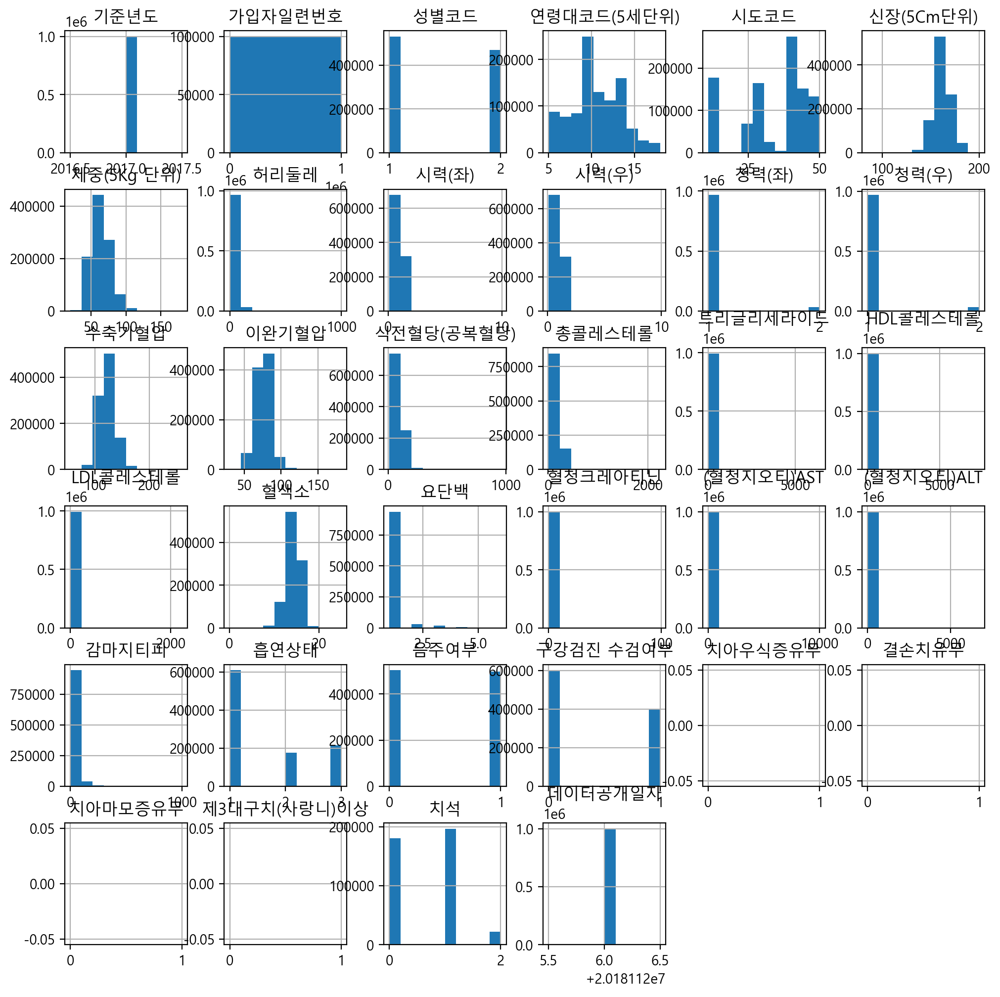

In [32]:
# df.hist()를 변수에 넣으면 출력값 없이 바로 시각화
h = df.hist(figsize=(12, 12))

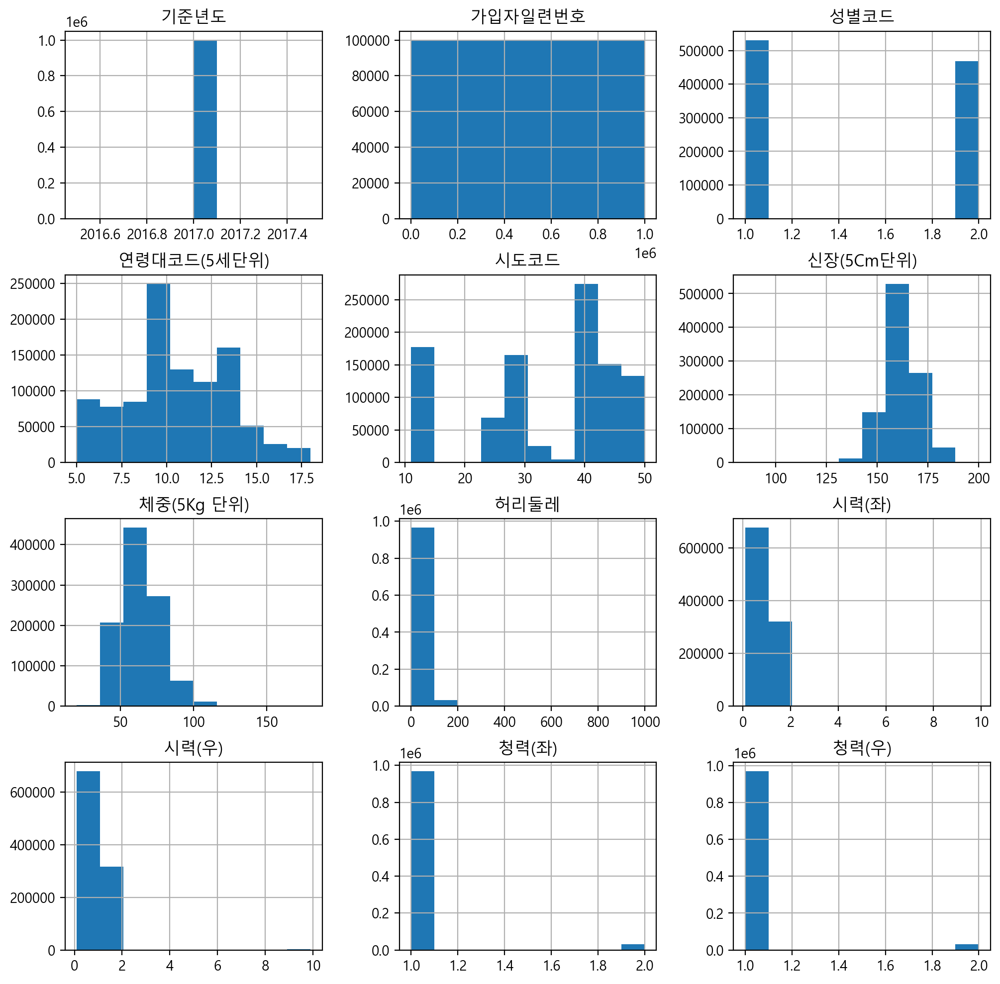

In [33]:
# iloc[]: 몇 번째에 있는 특정한 행, 열을 사용할 것인지 지정
# iloc[행:, 시작열:마지막열+1]
h = df.iloc[:, :12].hist(figsize=(12, 12))

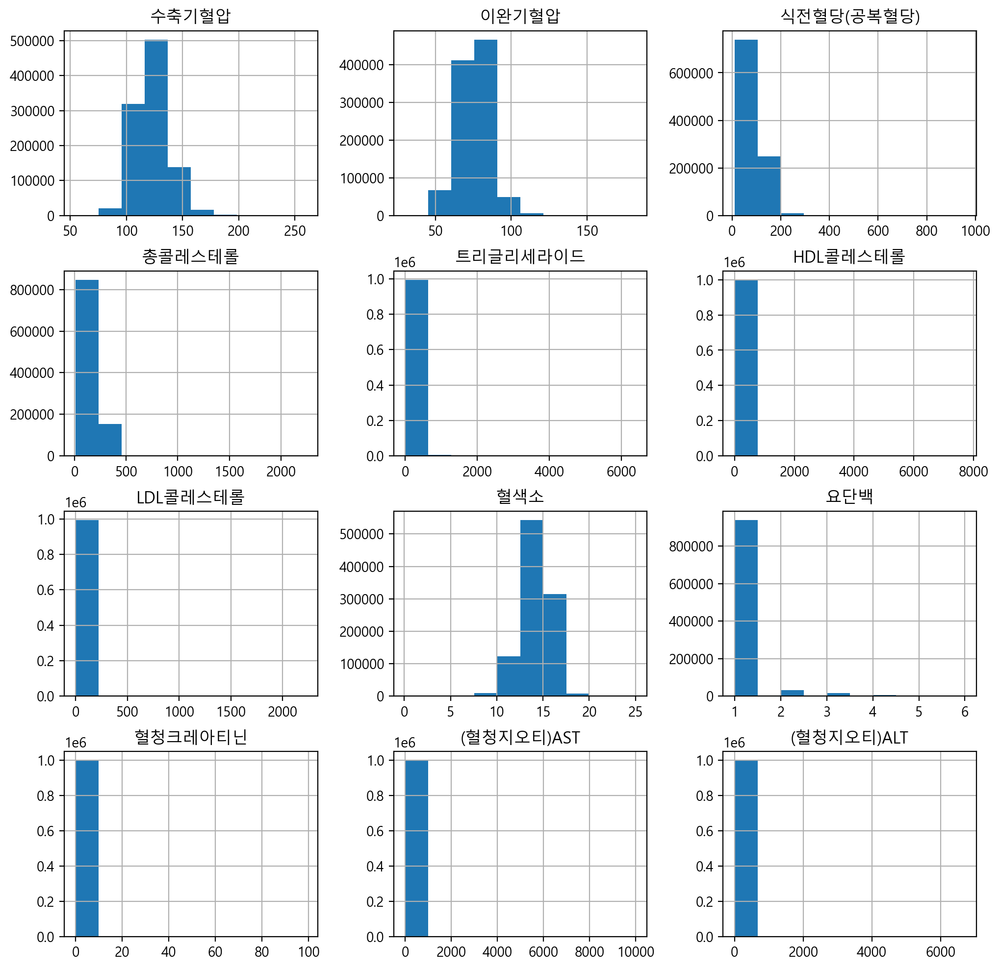

In [34]:
# 12 ~ 23번째 열 그리기
h = df.iloc[:, 12:24].hist(figsize=(12, 12))

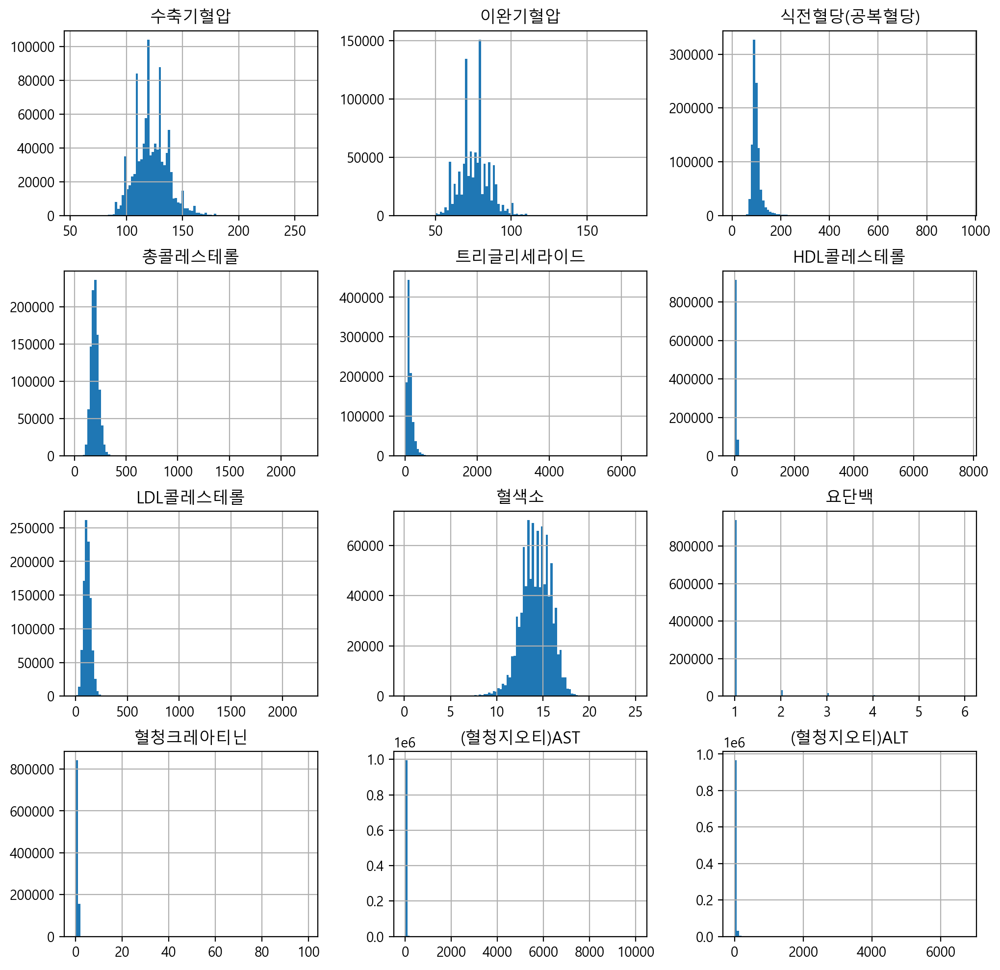

In [35]:
# bins 옵션으로 막대의 개수를 잘게 그림
h = df.iloc[:, 12:24].hist(figsize=(12, 12), bins=100)

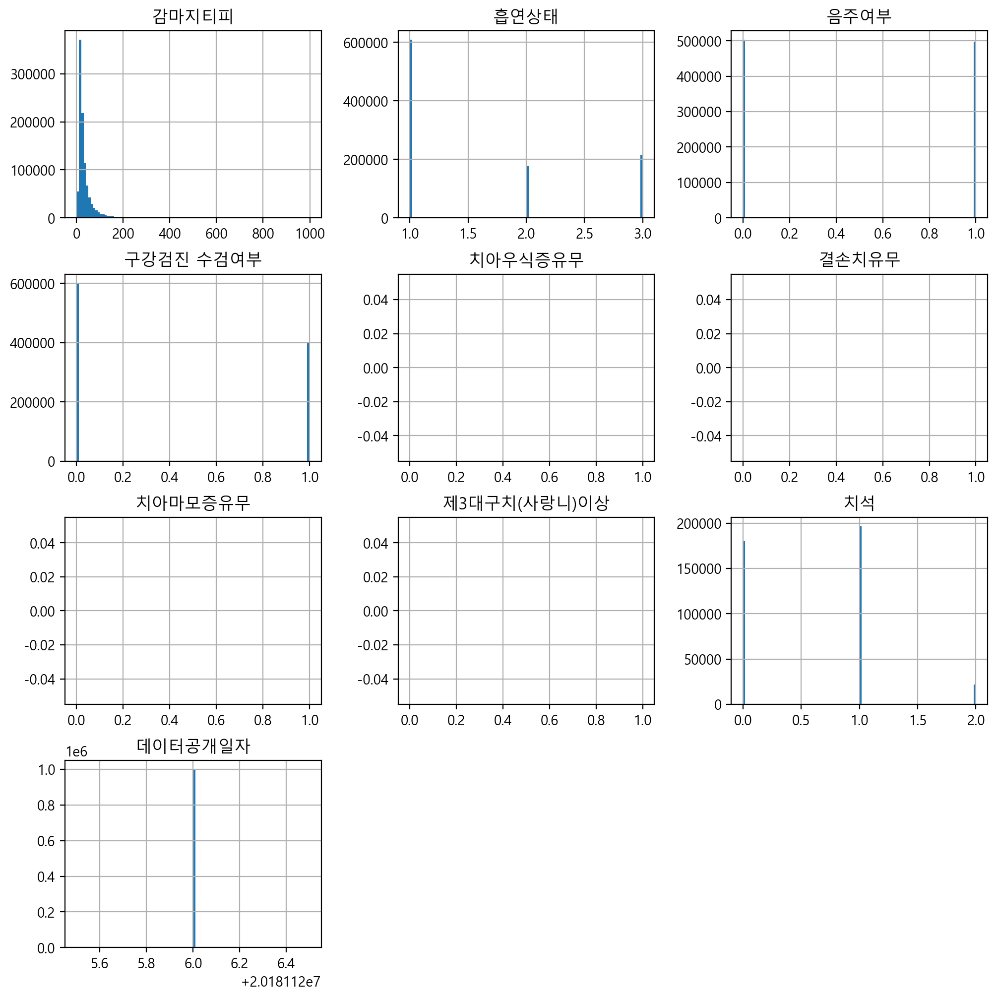

In [36]:
# 나머지 데이터들도 그래프 그리기
h = df.iloc[:, 24:].hist(figsize = (12, 12), bins = 100)

### 데이터의 빈도수 시각화하기

In [187]:
# random_state=1: 1,000,000개 중 랜덤으로 n개 가져옴
df_sample = df.sample(1000, random_state=1)
df_sample

,기준년도,가입자일련번호,성별코드,연령대코드(5세단위),시도코드,신장(5Cm단위),체중(5Kg 단위),허리둘레,시력(좌),시력(우),...,감마지티피,흡연상태,음주여부,구강검진 수검여부,치아우식증유무,결손치유무,치아마모증유무,제3대구치(사랑니)이상,치석,데이터공개일자
276826,2017,276827,2,12,11,155.0,85.0,113.0,0.7,1.0,...,35.0,1.0,0.0,0,NaN,NaN,NaN,NaN,NaN,20181126
849425,2017,849426,2,15,11,155.0,45.0,73.0,0.5,0.4,...,19.0,1.0,0.0,1,NaN,NaN,NaN,NaN,0.0,20181126
504499,2017,504500,1,11,47,170.0,45.0,63.0,0.7,0.4,...,15.0,3.0,0.0,0,NaN,NaN,NaN,NaN,NaN,20181126
601054,2017,601055,2,16,26,150.0,50.0,77.0,0.4,0.3,...,13.0,1.0,0.0,0,NaN,NaN,NaN,NaN,NaN,20181126
980221,2017,980222,2,13,41,150.0,65.0,95.0,1.0,0.8,...,265.0,1.0,0.0,0,NaN,NaN,NaN,NaN,NaN,20181126
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
890013,2017,890014,2,11,29,155.0,50.0,65.1,1.0,0.8,...,22.0,2.0,1.0,1,NaN,NaN,NaN,NaN,1.0,20181126
875389,2017,875390,2,9,11,155.0,45.0,66.5,0.9,0.8,...,12.0,1.0,1.0,1,NaN,NaN,NaN,NaN,0.0,20181126
358458,2017,358459,2,11,11,160.0,50.0,72.0,0.9,0.8,...,11.0,1.0,0.0,0,NaN,NaN,NaN,NaN,NaN,20181126
808228,2017,808229,1,9,48,175.0,65.0,75.2,1.2,1.2,...,122.0,3.0,1.0,1,NaN,NaN,NaN,NaN,0.0,20181126


In [39]:
# seaborn은 matplotlib을 쉽게 쓸 수 있는 highlevel interface고, 통계 지식 없이 고급 통계 그래프를 구현가능
# 범주형 데이터, 수치형 데이터에 따라 시각화에 접근하는 방식이 달라집

<Axes: xlabel='음주여부'>

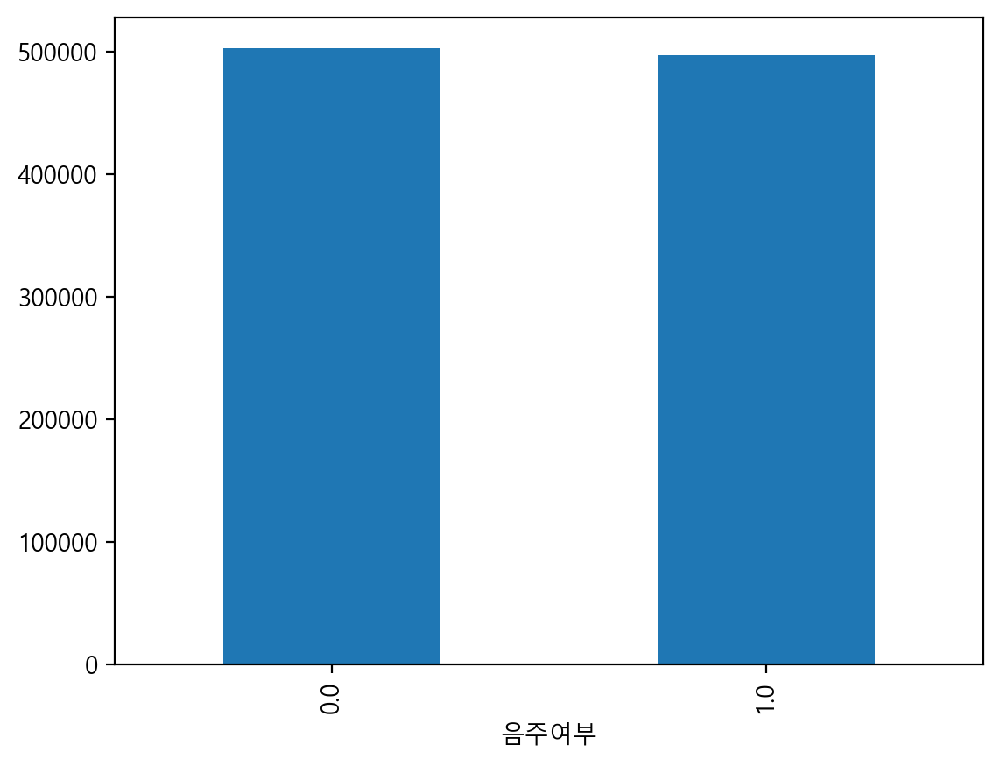

In [40]:
df["음주여부"].value_counts().plot.bar()

<Axes: xlabel='음주여부', ylabel='count'>

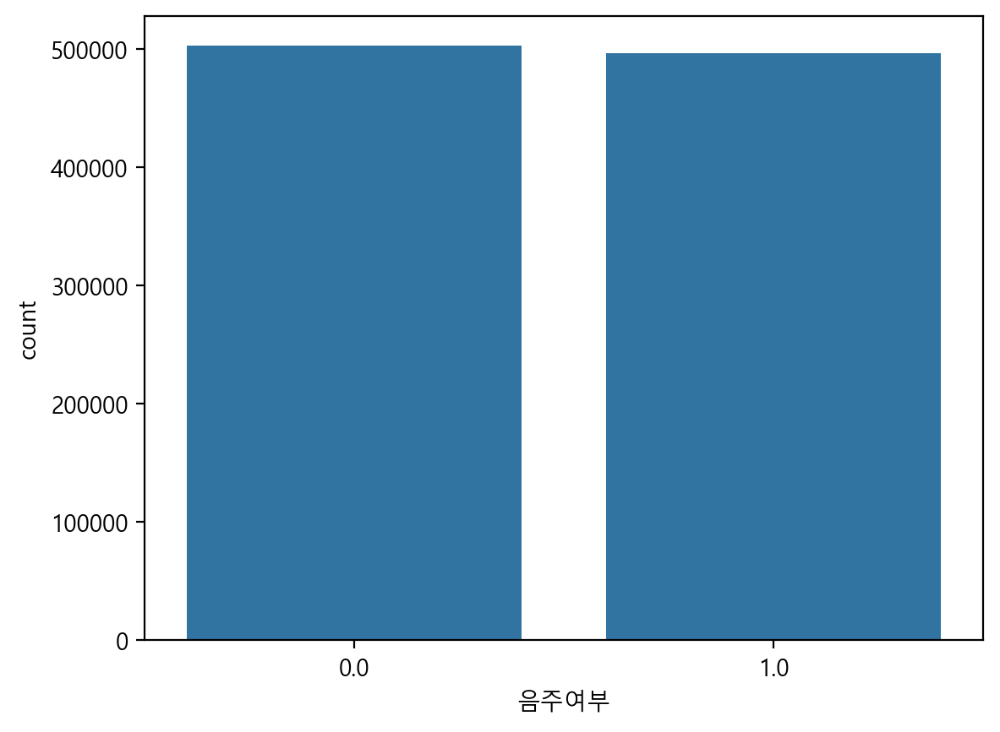

In [41]:
sns.countplot(x="음주여부", data=df)

<Axes: xlabel='음주여부', ylabel='count'>

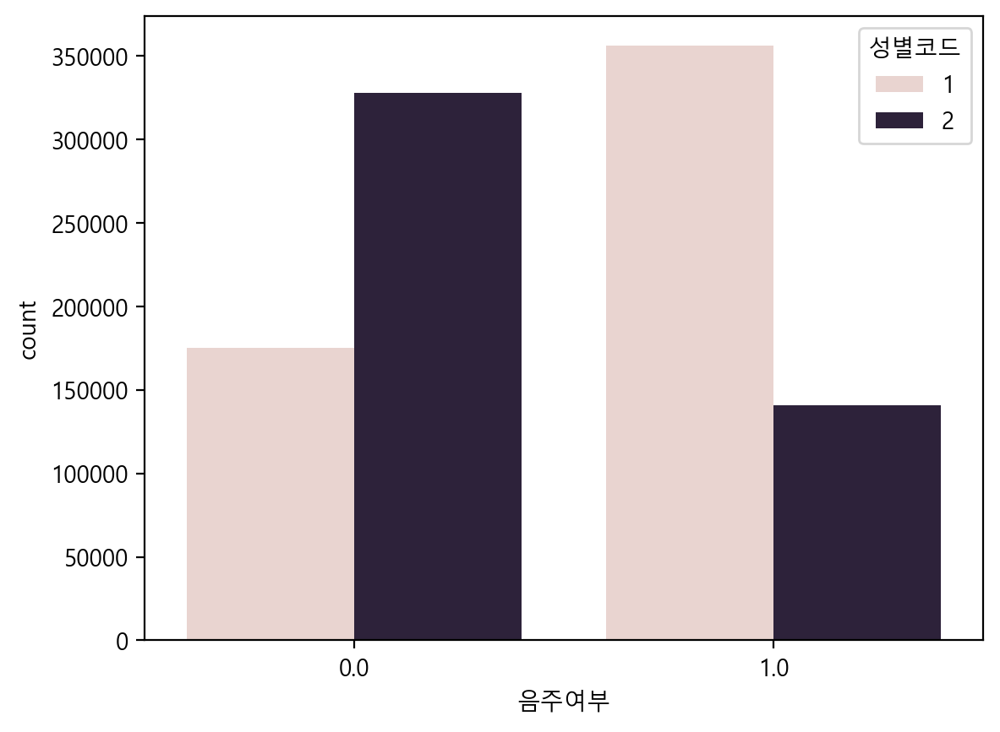

In [42]:
# hue를 사용해 성별코드로 색상을 구분해 그림
sns.countplot(x="음주여부", data=df, hue="성별코드")

<Axes: xlabel='연령대코드(5세단위)', ylabel='count'>

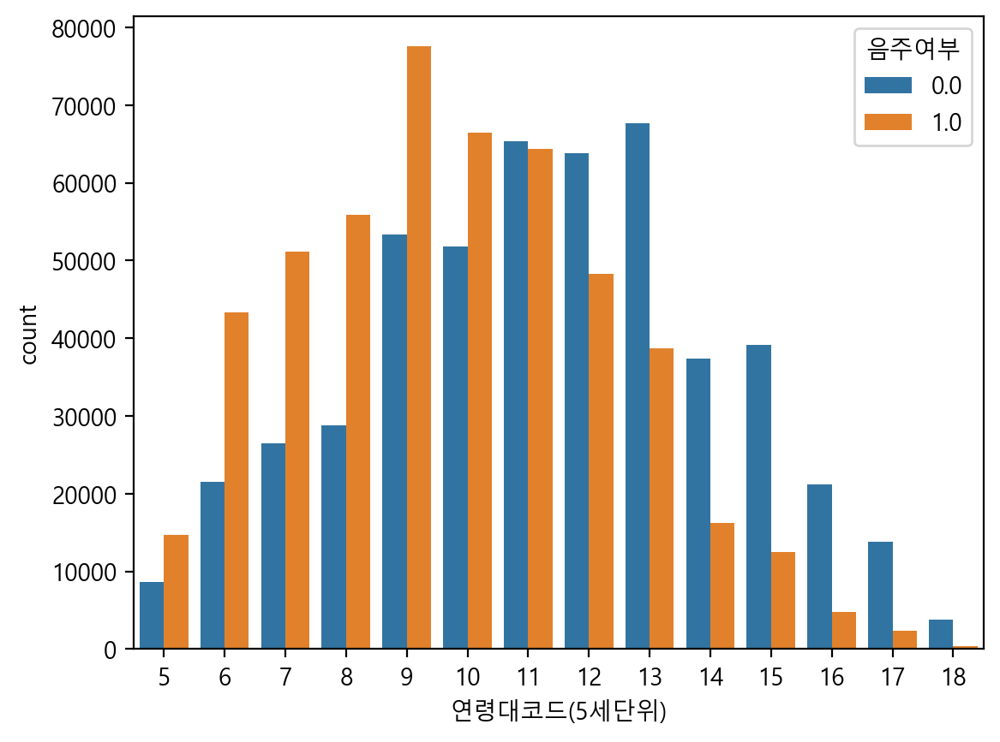

In [43]:
# 키와 몸무게는 연속형 데이터라고 볼 수 있지만 특정 범위로 묶는다면 범주형 데이터로 볼 수 있음
sns.countplot(data=df, x="연령대코드(5세단위)", hue="음주여부")

<Axes: xlabel='신장(5Cm단위)', ylabel='count'>

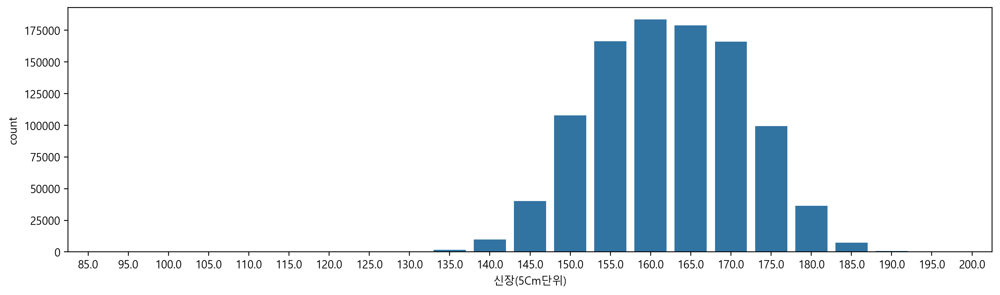

In [44]:
# plt.figure로 크기 조절 가능
plt.figure(figsize=(15,4))
sns.countplot(data=df, x="신장(5Cm단위)")

<Axes: xlabel='신장(5Cm단위)', ylabel='count'>

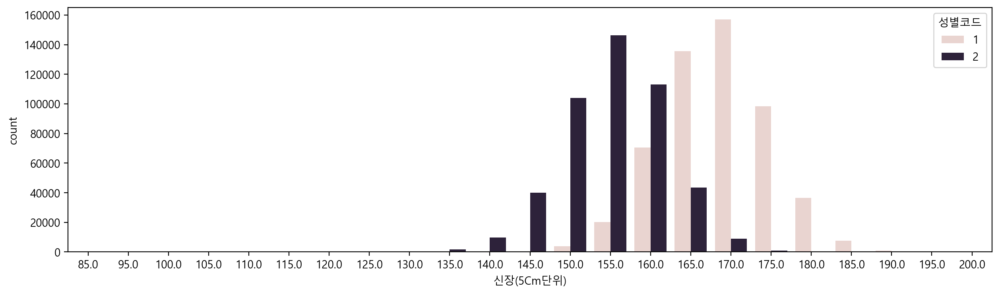

In [45]:
# 성별코드에 따른 신장 분포
plt.figure(figsize=(15,4))
sns.countplot(data=df, x="신장(5Cm단위)", hue="성별코드")

<Axes: xlabel='체중(5Kg 단위)', ylabel='count'>

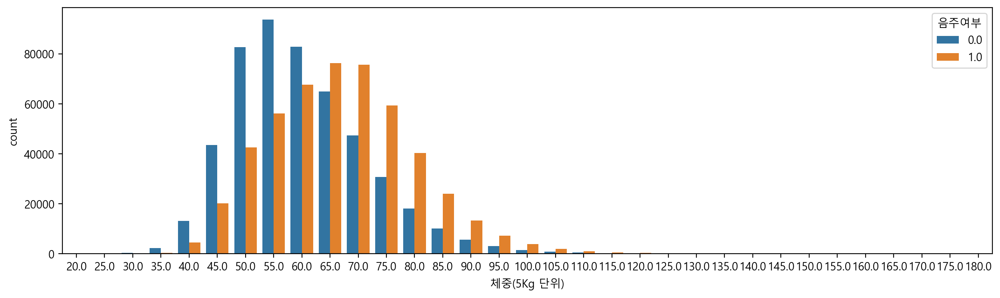

In [46]:
# 음주여부에 따른 체중의 차이
plt.figure(figsize=(15,4))
sns.countplot(data=df, x="체중(5Kg 단위)", hue="음주여부")

### 수치형 VS 범주형 데이터의 시각화

<Axes: xlabel='연령대코드(5세단위)', ylabel='총콜레스테롤'>

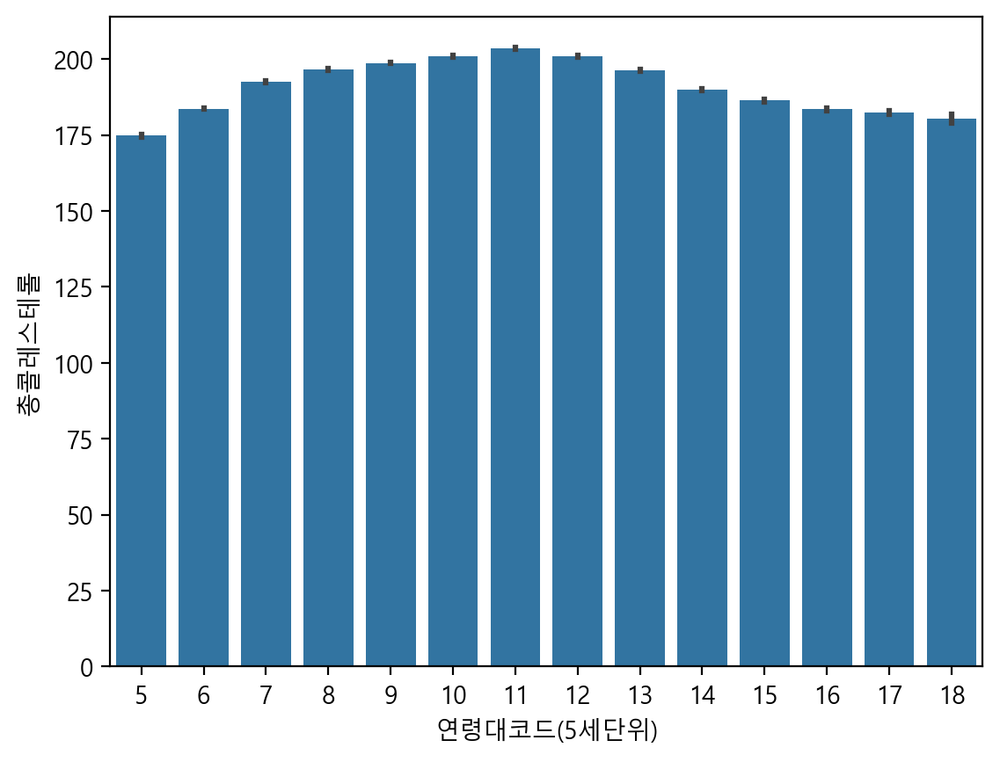

In [48]:
#연령대코드에 따른 총콜레스테롤 시각화
# barplot은 countplot에 비해 시간이 오래걸림 
# y축은 총콜레스테롤의 평균을 표시 
sns.barplot(data=df, x="연령대코드(5세단위)", y="총콜레스테롤")

<Axes: xlabel='연령대코드(5세단위)', ylabel='총콜레스테롤'>

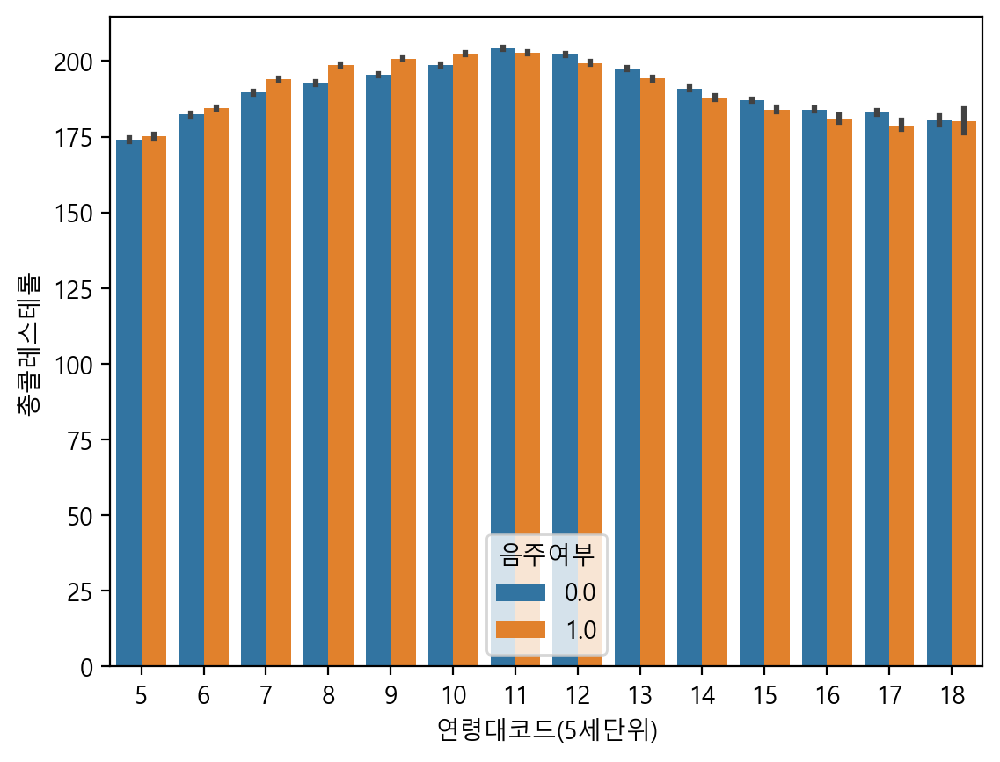

In [49]:
# hue=음주여부를 추가해 음주여부로 색상을 다르게 표시
sns.barplot(data=df, x="연령대코드(5세단위)", y="총콜레스테롤", hue="음주여부")

<Axes: xlabel='연령대코드(5세단위)', ylabel='총콜레스테롤'>

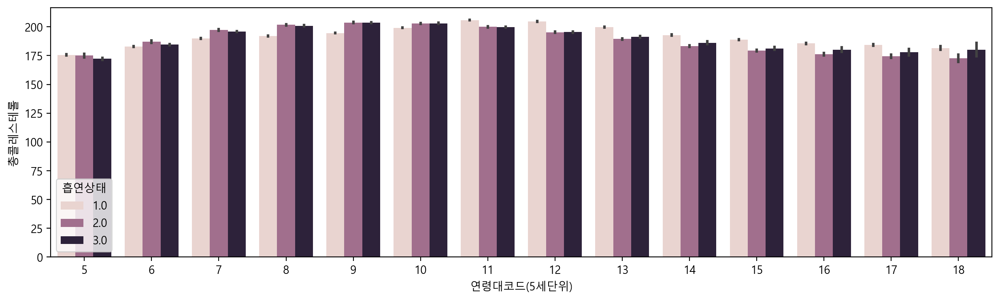

In [50]:
# hue에 흡연상태 넣음
plt.figure(figsize=(15,4))
sns.barplot(data=df, x="연령대코드(5세단위)", y="총콜레스테롤", hue="흡연상태")

<Axes: xlabel='연령대코드(5세단위)', ylabel='트리글리세라이드'>

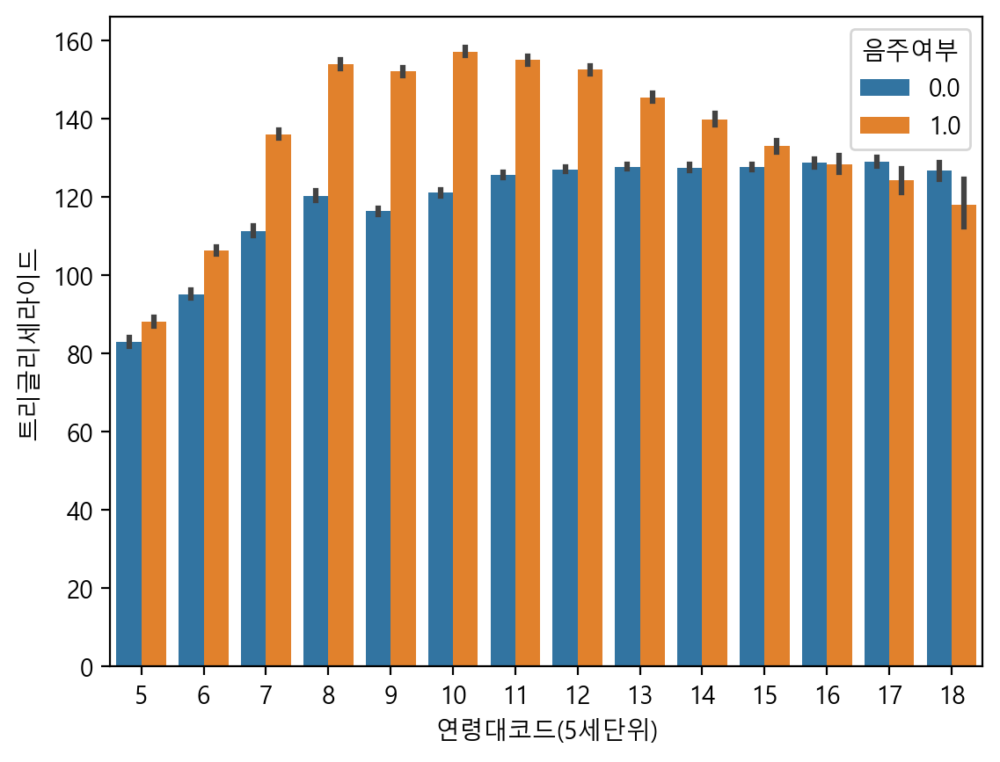

In [51]:
# ci: 신뢰구간 (errorbar=("ci",95): 95%의 신뢰구간)
# 트리글리세라이드: 중성지방수치
sns.barplot(data=df, x="연령대코드(5세단위)", y="트리글리세라이드", hue="음주여부", errorbar=("ci",95))

<Axes: xlabel='연령대코드(5세단위)', ylabel='체중(5Kg 단위)'>

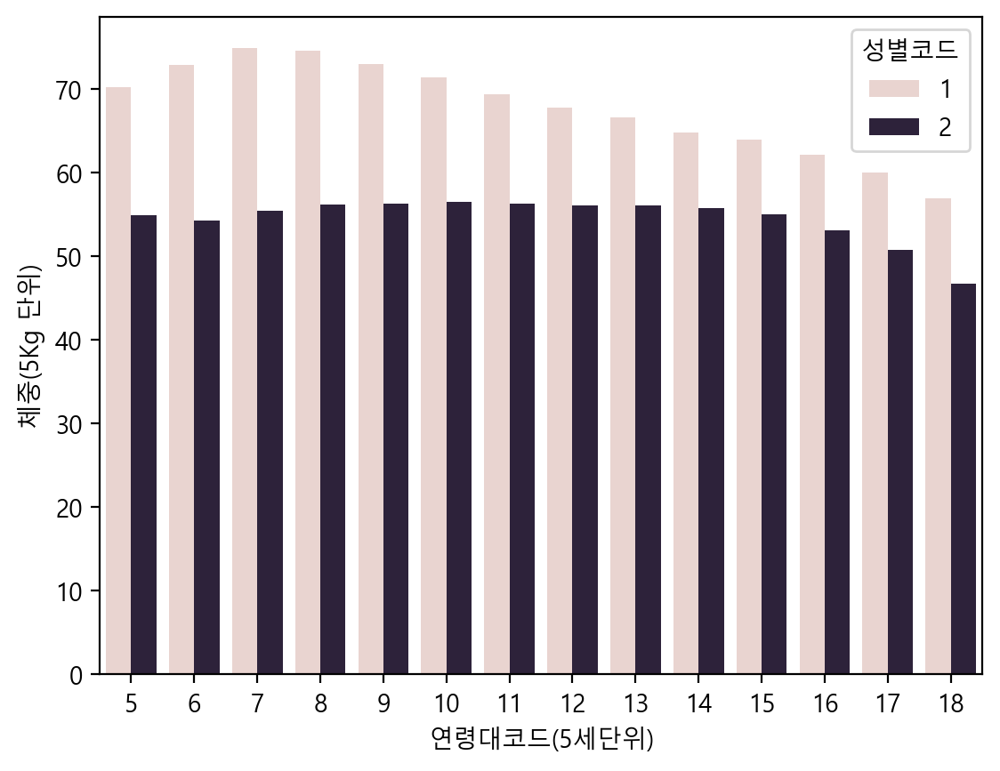

In [52]:
# 신뢰구간을 표시하고 싶지 않을때 None으로 설종
sns.barplot(data=df, x="연령대코드(5세단위)", y="체중(5Kg 단위)", hue="성별코드", errorbar=None)

<Axes: xlabel='연령대코드(5세단위)', ylabel='체중(5Kg 단위)'>

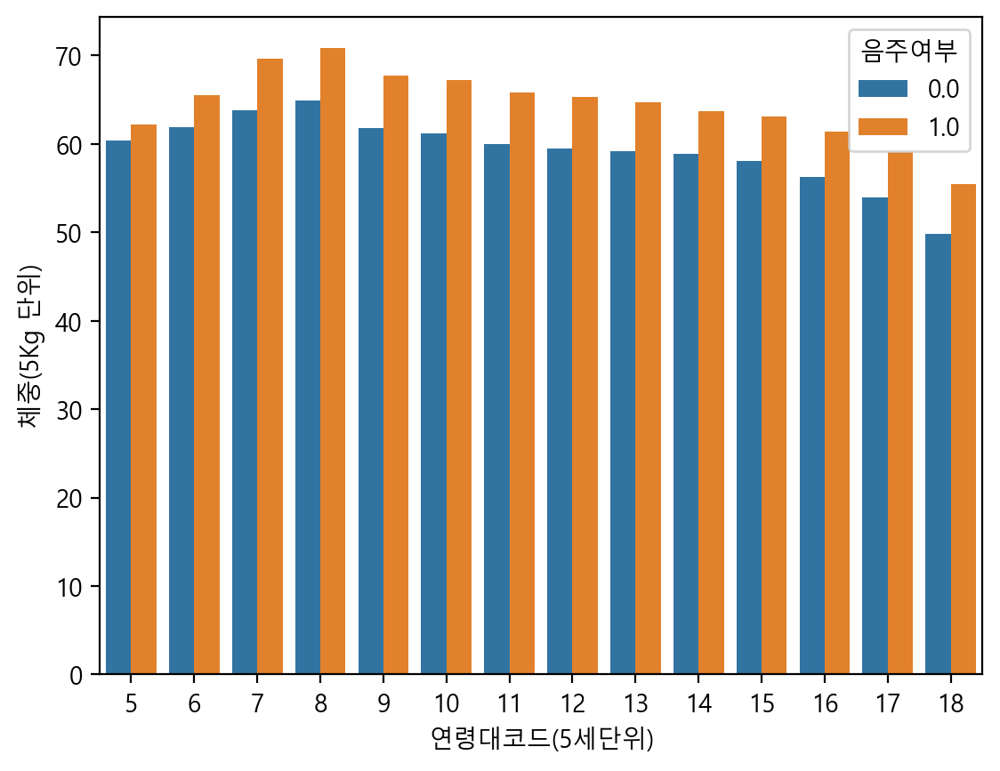

In [53]:
# 성별대신 음주여부로 연령대별 체중 시각화
sns.barplot(data=df, x="연령대코드(5세단위)", y="체중(5Kg 단위)", hue="음주여부", errorbar=None)

<Axes: xlabel='연령대코드(5세단위)', ylabel='체중(5Kg 단위)'>

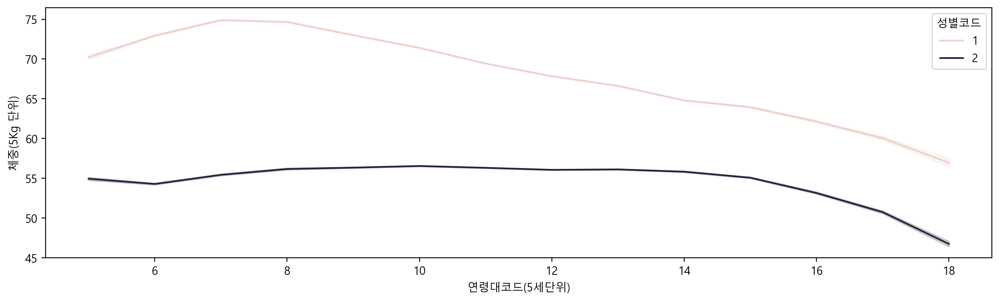

In [54]:
# lineplot(선 그래프)
# 연령대코드에 따른 체중을 성별코드로 나누어 선 그래프로 표현
plt.figure(figsize=(15,4))
sns.lineplot(data=df, x="연령대코드(5세단위)", y="체중(5Kg 단위)", hue="성별코드")

<Axes: xlabel='연령대코드(5세단위)', ylabel='신장(5Cm단위)'>

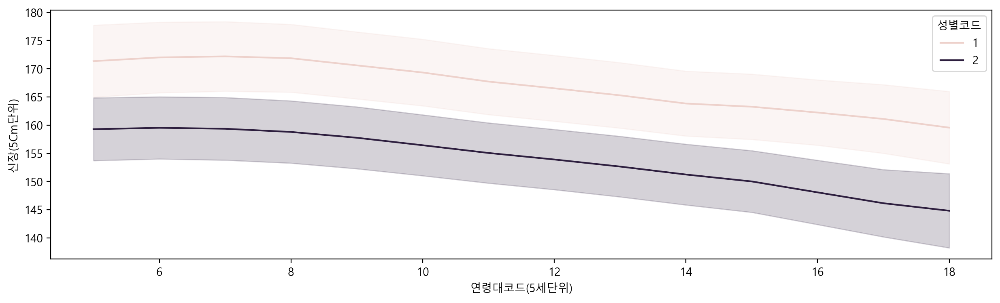

In [55]:
# 연령대코드에 따른 신장을 성별코드로 나누어 선 그래프로 표현
# errorbar="sd": 표준편차 표시
plt.figure(figsize=(15,4))
sns.lineplot(data=df, x="연령대코드(5세단위)", y="신장(5Cm단위)", hue="성별코드", errorbar="sd")

<Axes: xlabel='연령대코드(5세단위)', ylabel='신장(5Cm단위)'>

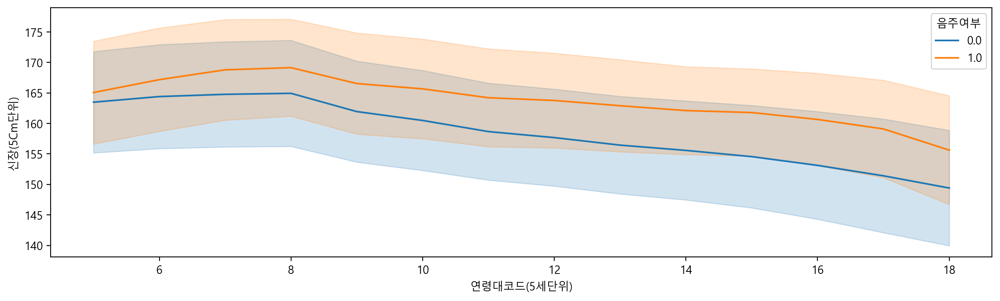

In [56]:
# 연령대코드에 따른 신장을 음주여부로 나누어 선 그래프로 표현
plt.figure(figsize=(15,4))
sns.lineplot(data=df, x="연령대코드(5세단위)", y="신장(5Cm단위)", hue="음주여부", errorbar="sd")

<Axes: xlabel='연령대코드(5세단위)', ylabel='신장(5Cm단위)'>

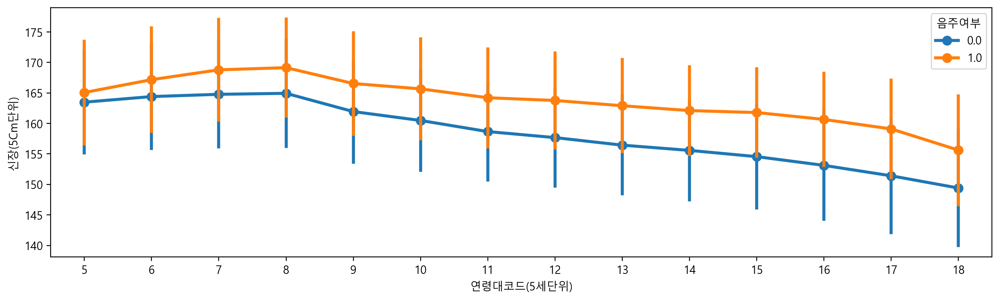

In [57]:
# pointplot: 막대를 통해 편차와 신뢰구간을 표현
plt.figure(figsize=(15,4))
sns.pointplot(data=df, x="연령대코드(5세단위)", y="신장(5Cm단위)", hue="음주여부", errorbar="sd")

<Axes: xlabel='연령대코드(5세단위)', ylabel='신장(5Cm단위)'>

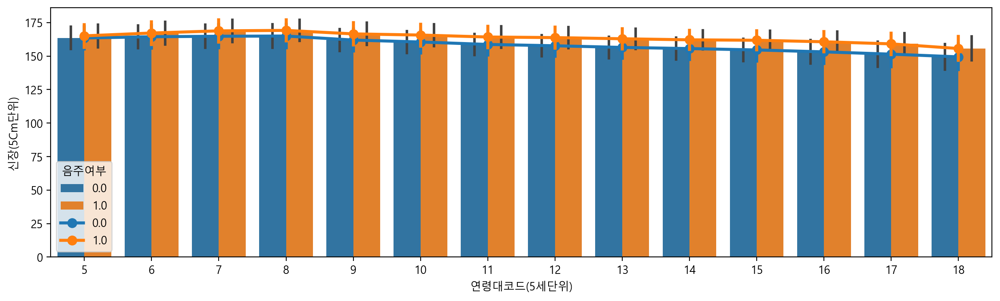

In [58]:
# 두개의 그래프를 같이 그릴 수 있음
plt.figure(figsize=(15,4))
sns.barplot(data=df, x="연령대코드(5세단위)", y="신장(5Cm단위)", hue="음주여부", errorbar="sd")
sns.pointplot(data=df, x="연령대코드(5세단위)", y="신장(5Cm단위)", hue="음주여부", errorbar="sd")

<Axes: xlabel='연령대코드(5세단위)', ylabel='신장(5Cm단위)'>

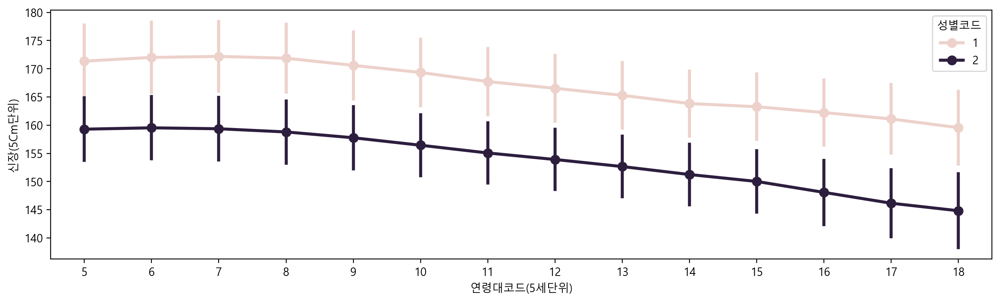

In [59]:
plt.figure(figsize=(15,4))
sns.pointplot(data=df, x="연령대코드(5세단위)", y="신장(5Cm단위)", hue="성별코드", errorbar="sd")

<Axes: xlabel='연령대코드(5세단위)', ylabel='혈색소'>

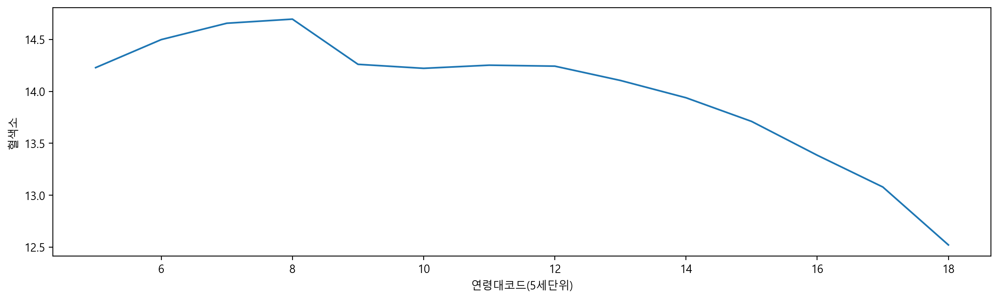

In [60]:
# 연령대코드에 따른 혈색소를 선 그래프로 표시
plt.figure(figsize=(15,4))
sns.lineplot(data=df, x="연령대코드(5세단위)", y="혈색소", errorbar=None)

<Axes: xlabel='연령대코드(5세단위)', ylabel='혈색소'>

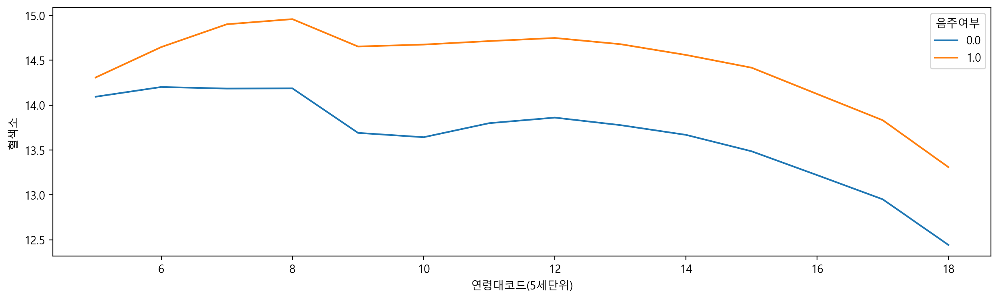

In [61]:
# 연령대코드에 따른 혈색소를 음주여부로 나눈 선 그래프
plt.figure(figsize=(15,4))
sns.lineplot(data=df, x="연령대코드(5세단위)", y="혈색소", hue="음주여부", errorbar=None)

In [62]:
# barplot은 막대로 개별값을 표현하는데  lineplot, pointplot을 통해서는 선으로 기울기까지 표현할 수 있습니다. 
# 가격 데이터, 매출/재고 데이터는 대체로 lineplot, pointplot으로 그리는 것이 좋습니다.

### 데이터를 좀 더 자세히 표현하기
#### boxplot
 * 사분위수 범위(IQR): 3사분위수 - 1사분위수
 * 3사분위수보다 1.5 x IQR 이상을 초과하는 값과 Q1보다 1.5 x IQR 이상 미달하는 값은 이상치(점, 원, 별표 모양)

<Axes: xlabel='신장(5Cm단위)', ylabel='체중(5Kg 단위)'>

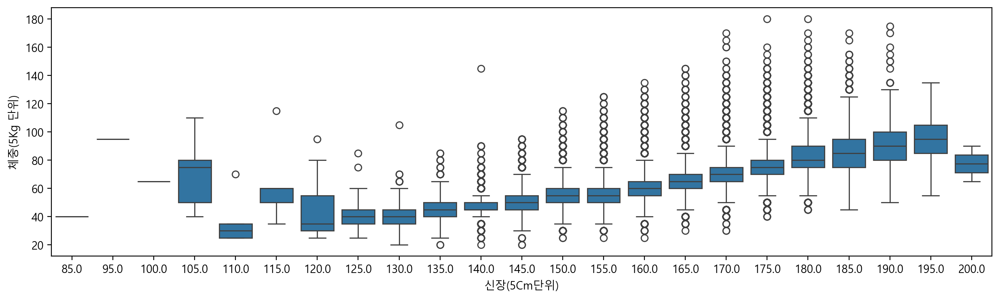

In [64]:
# 특정 column의 값들을 boxplot으로 그릴 수 있음
plt.figure(figsize=(15,4))
sns.boxplot(data=df, x="신장(5Cm단위)", y="체중(5Kg 단위)")

<Axes: xlabel='신장(5Cm단위)', ylabel='체중(5Kg 단위)'>

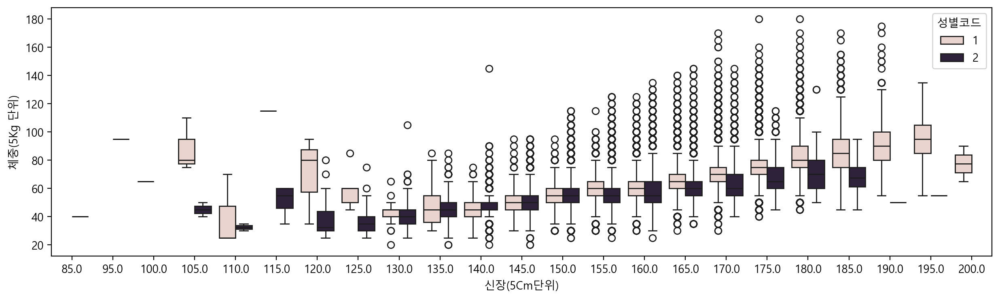

In [65]:
# boxplot은 다른 plot들과 마찬가지로 hue에 성별코드를 넣어 분리해서 볼 수 있음
plt.figure(figsize=(15,4))
sns.boxplot(data=df, x="신장(5Cm단위)", y="체중(5Kg 단위)", hue="성별코드")

<Axes: xlabel='신장(5Cm단위)', ylabel='체중(5Kg 단위)'>

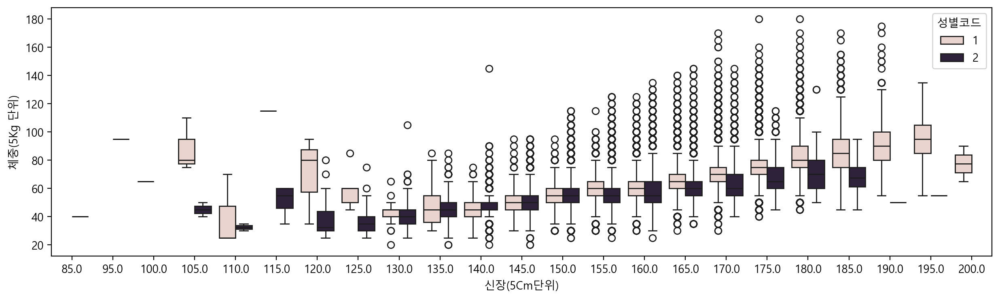

In [66]:
# hue="음주여부" 로 바꾸어 확인
plt.figure(figsize=(15,4))
sns.boxplot(data=df, x="신장(5Cm단위)", y="체중(5Kg 단위)", hue="성별코드")

#### violinplot
 * boxplot의 단점을 보완해 더 자세히 보여주는 그래프

<Axes: xlabel='신장(5Cm단위)', ylabel='체중(5Kg 단위)'>

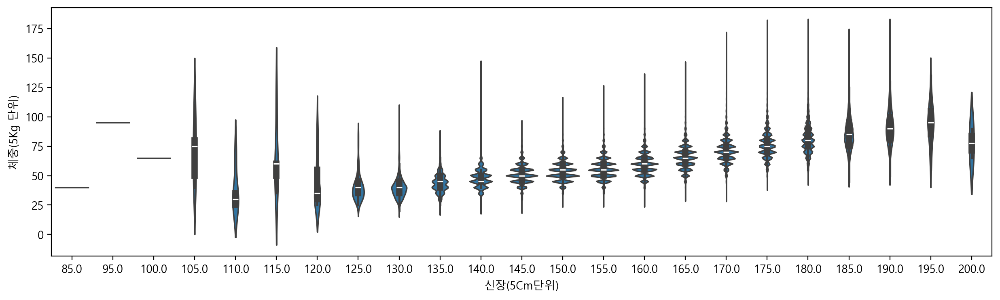

In [68]:
plt.figure(figsize=(15, 4))
sns.violinplot(data=df, x="신장(5Cm단위)", y="체중(5Kg 단위)")

<Axes: xlabel='신장(5Cm단위)', ylabel='체중(5Kg 단위)'>

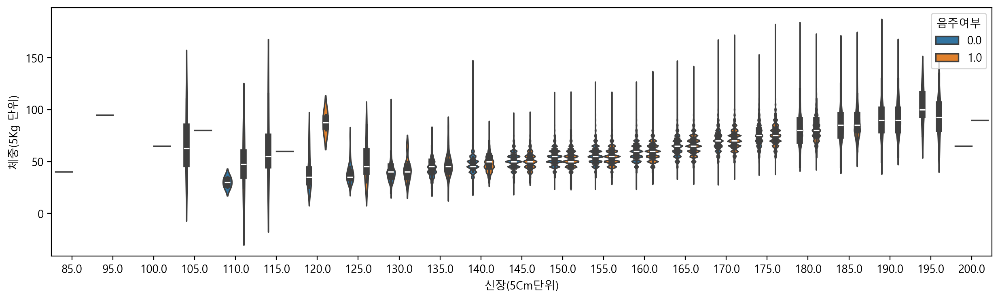

In [69]:
plt.figure(figsize=(15, 4))
sns.violinplot(data=df, x="신장(5Cm단위)", y="체중(5Kg 단위)", hue="음주여부")

<Axes: xlabel='신장(5Cm단위)', ylabel='체중(5Kg 단위)'>

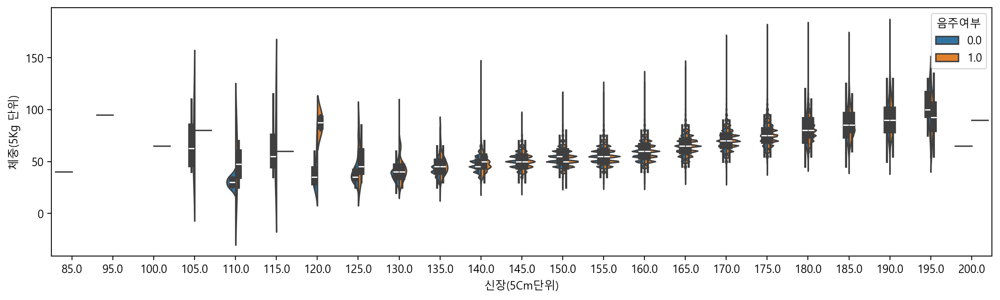

In [70]:
# split: 두개의 데이터를 붙여서 볼 수 있음
plt.figure(figsize=(15, 4))
sns.violinplot(data=df, x="신장(5Cm단위)", y="체중(5Kg 단위)", hue="음주여부", split=True)

<Axes: xlabel='연령대코드(5세단위)', ylabel='혈색소'>

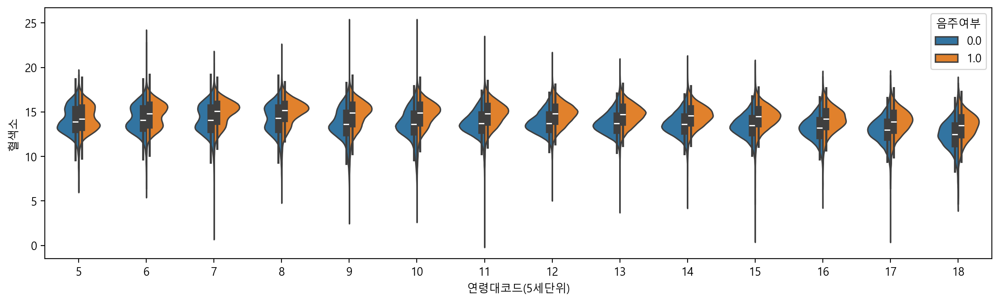

In [71]:
plt.figure(figsize=(15, 4))
sns.violinplot(data=df, x="연령대코드(5세단위)", y="혈색소", hue="음주여부", split=True)

#### swarm plot (산점도)

C:\Users\70160\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 37.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\70160\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 52.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\70160\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 51.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\70160\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 55.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\70160\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 48.0% of the points

<Axes: xlabel='신장(5Cm단위)', ylabel='체중(5Kg 단위)'>

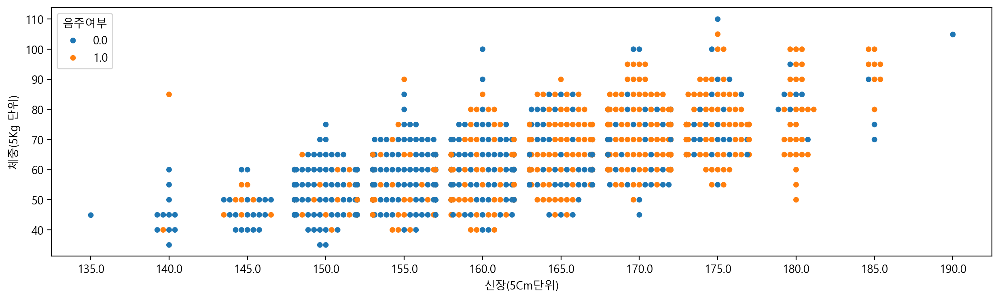

In [73]:
plt.figure(figsize=(15, 4))
sns.swarmplot(data=df_sample, x="신장(5Cm단위)", y="체중(5Kg 단위)", hue="음주여부")

C:\Users\70160\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 37.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\70160\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 52.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\70160\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 51.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\70160\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 55.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\70160\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 48.0% of the points

<Axes: xlabel='신장(5Cm단위)', ylabel='체중(5Kg 단위)'>

C:\Users\70160\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 37.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\70160\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 52.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\70160\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 51.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\70160\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 55.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\70160\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 48.0% of the points

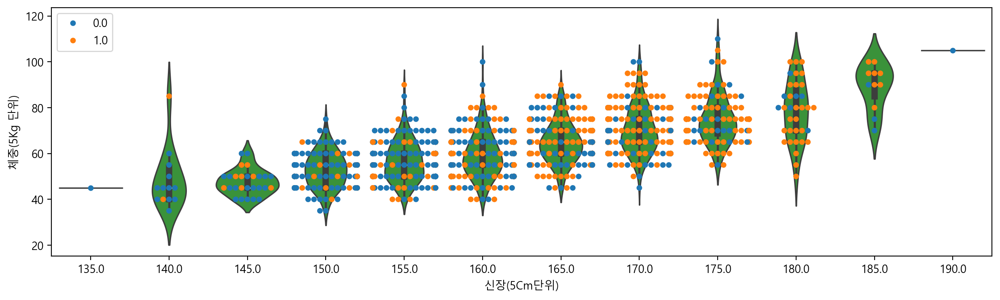

In [74]:
# 여러 그래프를 같이 표현할 수 있음
plt.figure(figsize=(15, 4))
sns.swarmplot(data=df_sample, x="신장(5Cm단위)", y="체중(5Kg 단위)", hue="음주여부")
sns.violinplot(data=df_sample, x="신장(5Cm단위)", y="체중(5Kg 단위)")

C:\Users\70160\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 8.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\70160\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 12.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\70160\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 9.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\70160\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 12.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


<Axes: xlabel='연령대코드(5세단위)', ylabel='혈색소'>

C:\Users\70160\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 12.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


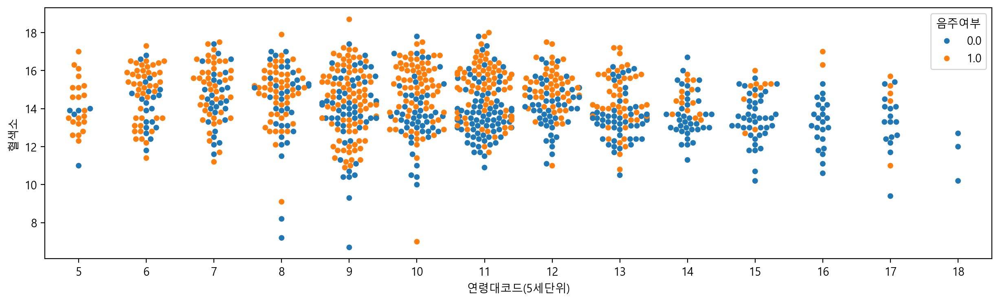

In [75]:
# 연령대코드에 따른 혈색소를 음주여부로 색상을 나누어 산점도 표현
plt.figure(figsize=(15, 4))
sns.swarmplot(data=df_sample, x="연령대코드(5세단위)", y="혈색소", hue="음주여부")

#### lmplot (회귀선)

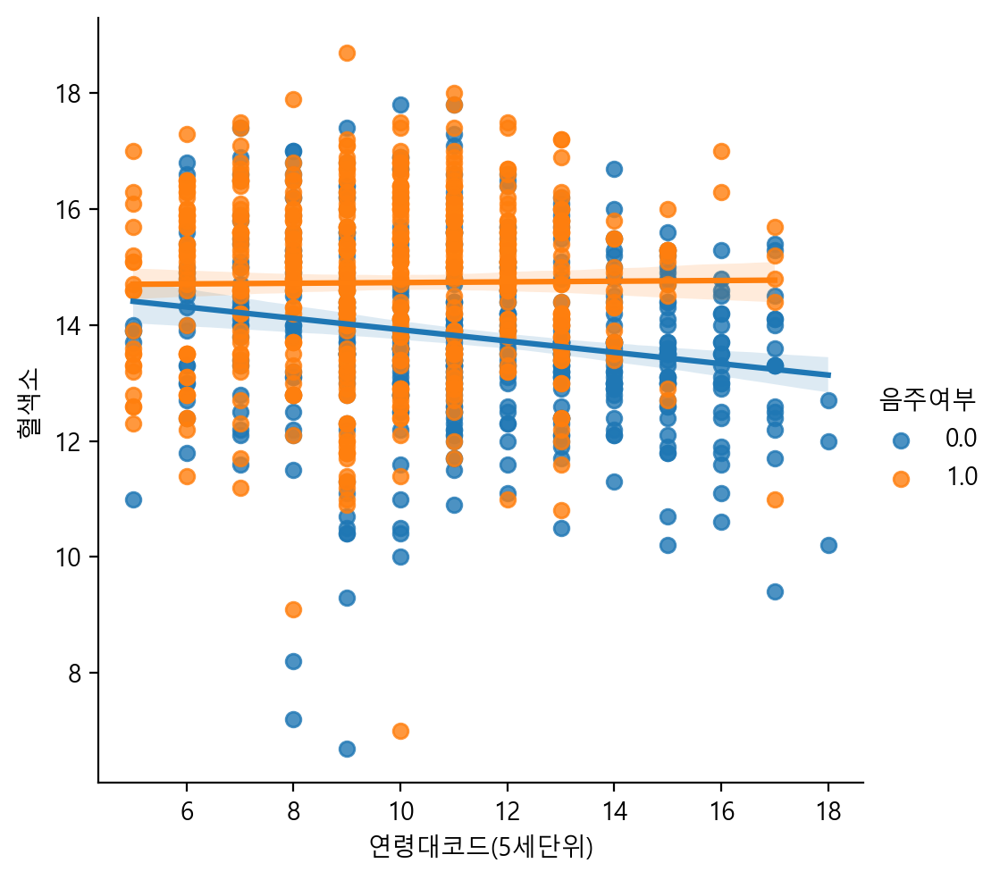

In [77]:
sns.lmplot(data=df_sample, x="연령대코드(5세단위)", y="혈색소", hue="음주여부")

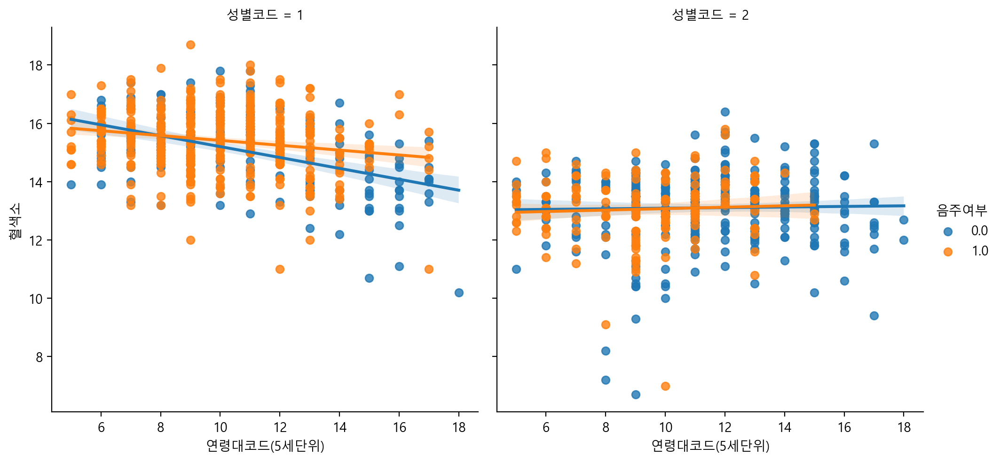

In [78]:
# col: 색상을 다르게 하여 데이터를 분류해 볼 수 있음
sns.lmplot(data=df_sample, x="연령대코드(5세단위)", y="혈색소", hue="음주여부", col="성별코드")

In [79]:
# 정리
# lmplot은 값들이 겹쳐서 보이는데 분포를 보고 싶다면 swarmplot을 사용하는 게 좋습니다. 
# swarmplot(산점도)는 회귀선을 그리거나 다변수 시각화를 할 때 좋습니다.
# x축에도 수치형 데이터를 넣어도 되지만 막대가 너무 많으면 보기에 불편. 
# barplot을 기울기로 보고 싶다면 lineplot이 좋습니다.
# boxplot을 그리면 이상치를 확인하기 좋습니다. violinplot은 분포를 더 자세히 볼 수 있습니다.

### 산점도(산포도)와 회귀선 상관관계 보기 - scatterplot, lmplot
 * scatterplot: 수치형 데이터를 볼 때 사용하기 좋다, 그래프의 이상치를 파악하기 쉬움
 * lmplot: 상관관계를 더 잘 파악할 수 있다

<Axes: xlabel='(혈청지오티)AST', ylabel='(혈청지오티)ALT'>

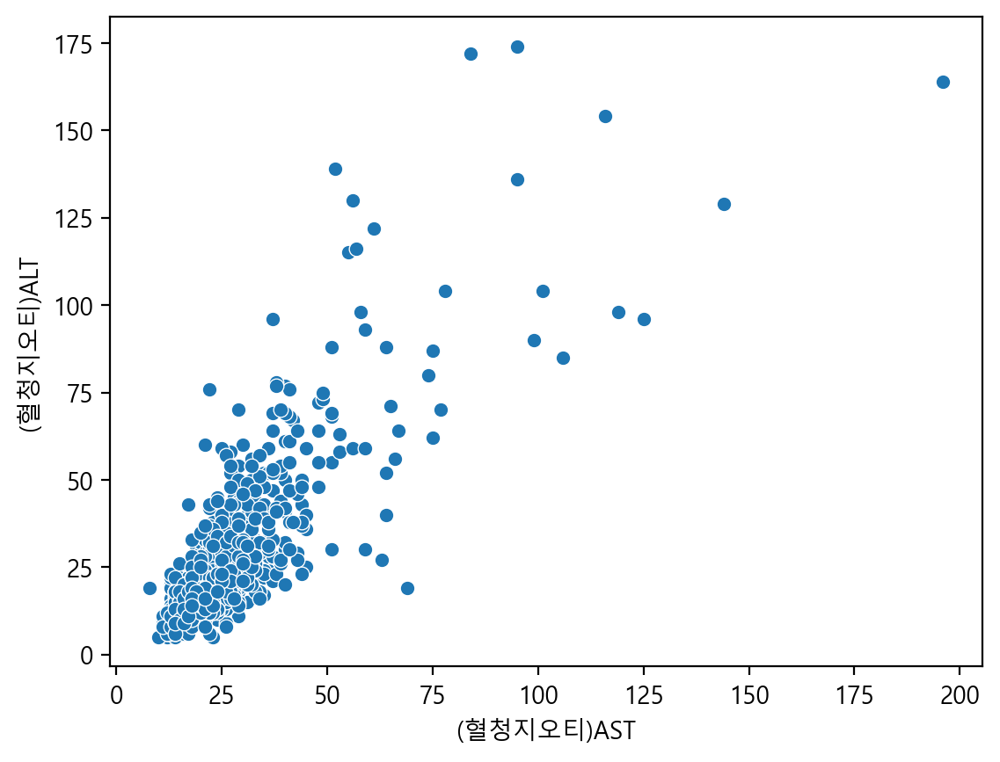

In [81]:
# AST에 따른 ALT를 산점도로 표시
sns.scatterplot(data=df_sample, x="(혈청지오티)AST", y="(혈청지오티)ALT")

<Axes: xlabel='(혈청지오티)AST', ylabel='(혈청지오티)ALT'>

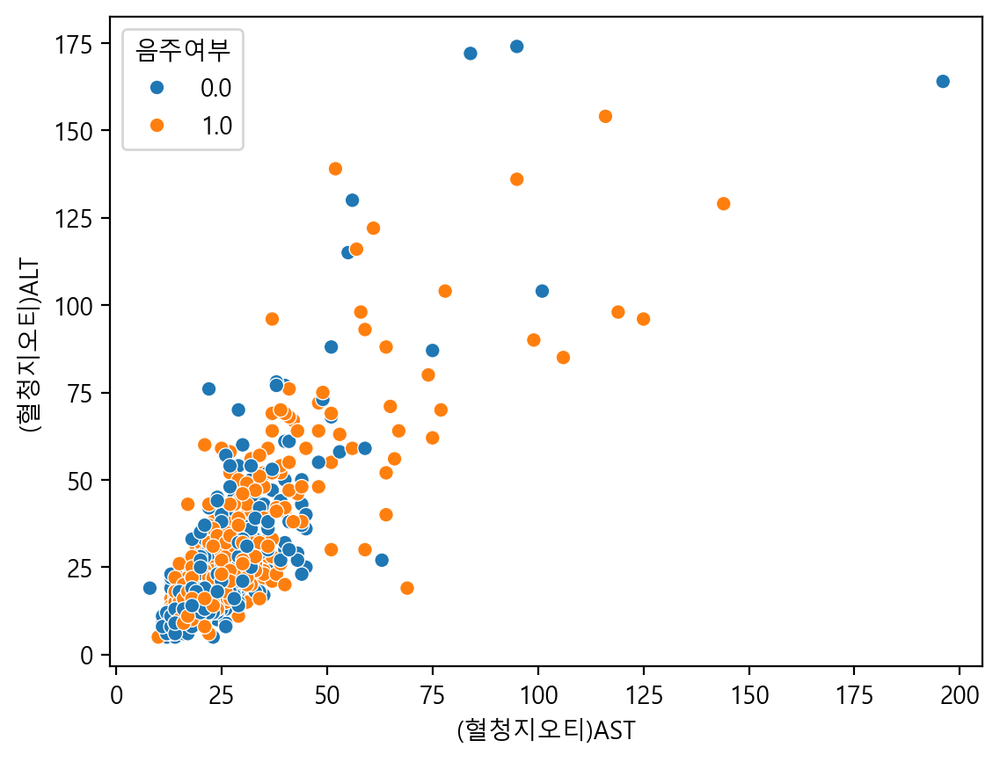

In [82]:
# 음주여부에 따라 차이가 있는지 확인
sns.scatterplot(data=df_sample, x="(혈청지오티)AST", y="(혈청지오티)ALT", hue="음주여부")

<Axes: xlabel='(혈청지오티)AST', ylabel='(혈청지오티)ALT'>

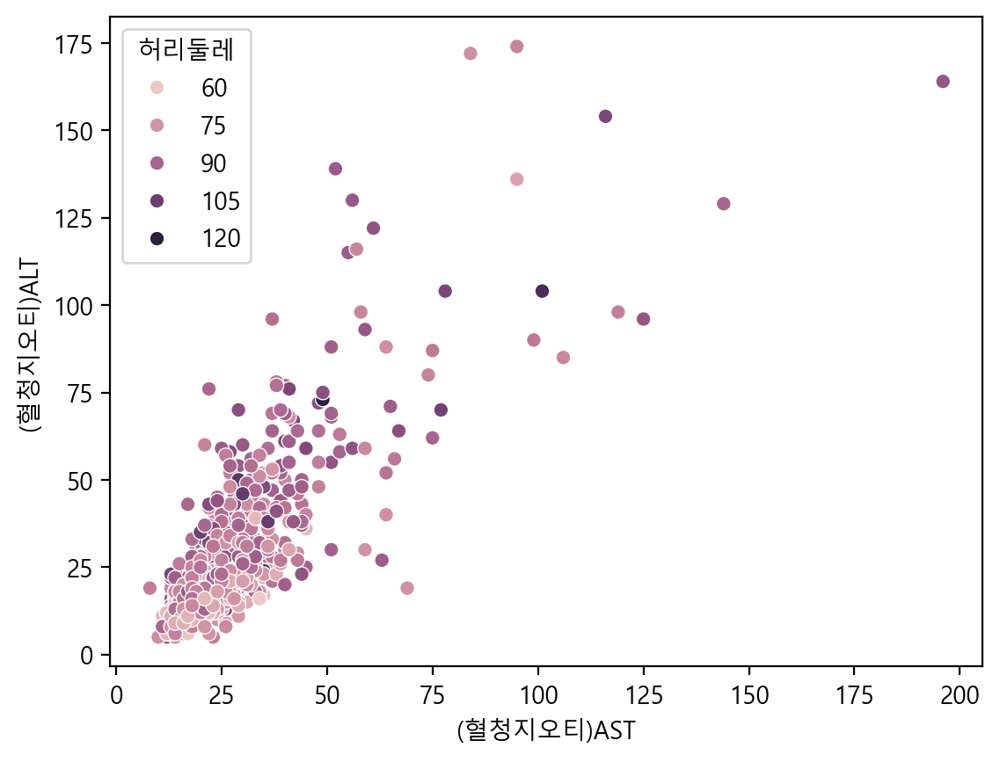

In [83]:
sns.scatterplot(data=df_sample, x="(혈청지오티)AST", y="(혈청지오티)ALT", hue="허리둘레")

<Axes: xlabel='(혈청지오티)AST', ylabel='(혈청지오티)ALT'>

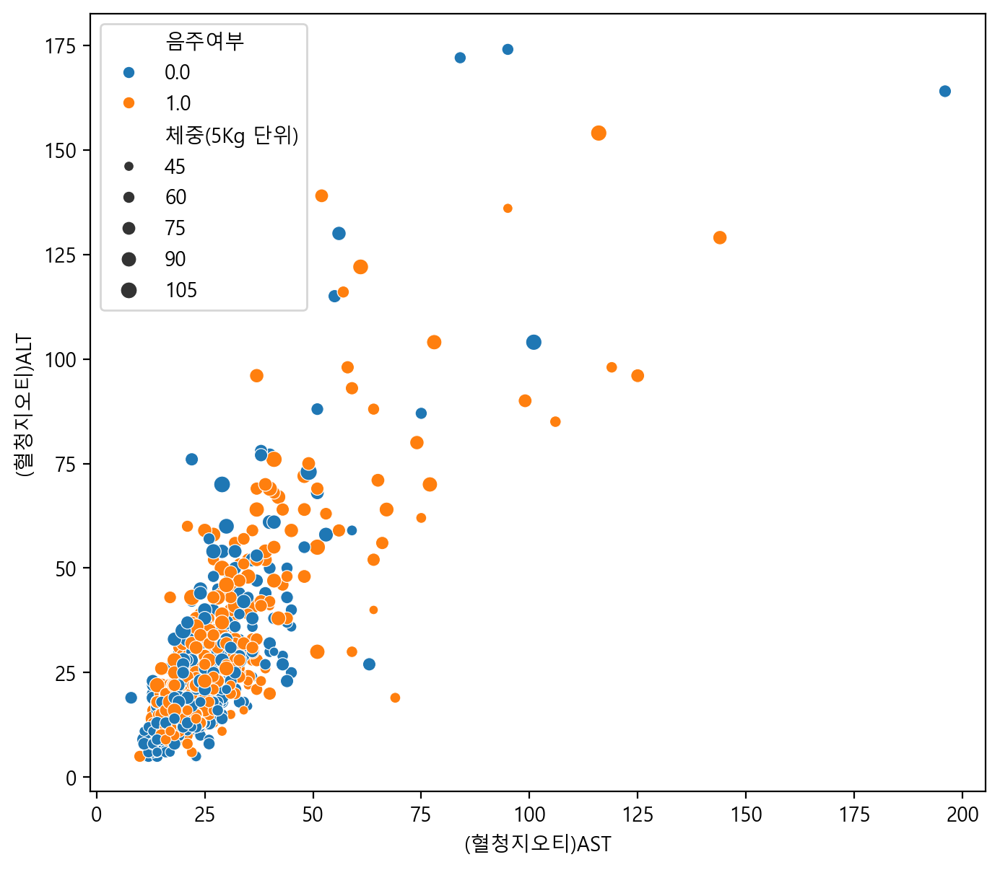

In [84]:
# size: 체중에 따라 크기를 다르게 지정
plt.figure(figsize=(8, 7))
sns.scatterplot(data=df_sample, x="(혈청지오티)AST", y="(혈청지오티)ALT", hue="음주여부", size="체중(5Kg 단위)")

#### lmplot
 * categorical 데이터로 인식하기 때문에 격자로 표시됨
 * 왼쪽 아래에서 오른쪽 위로 선이 그려지면 양의 상관관계가 있다고 표현

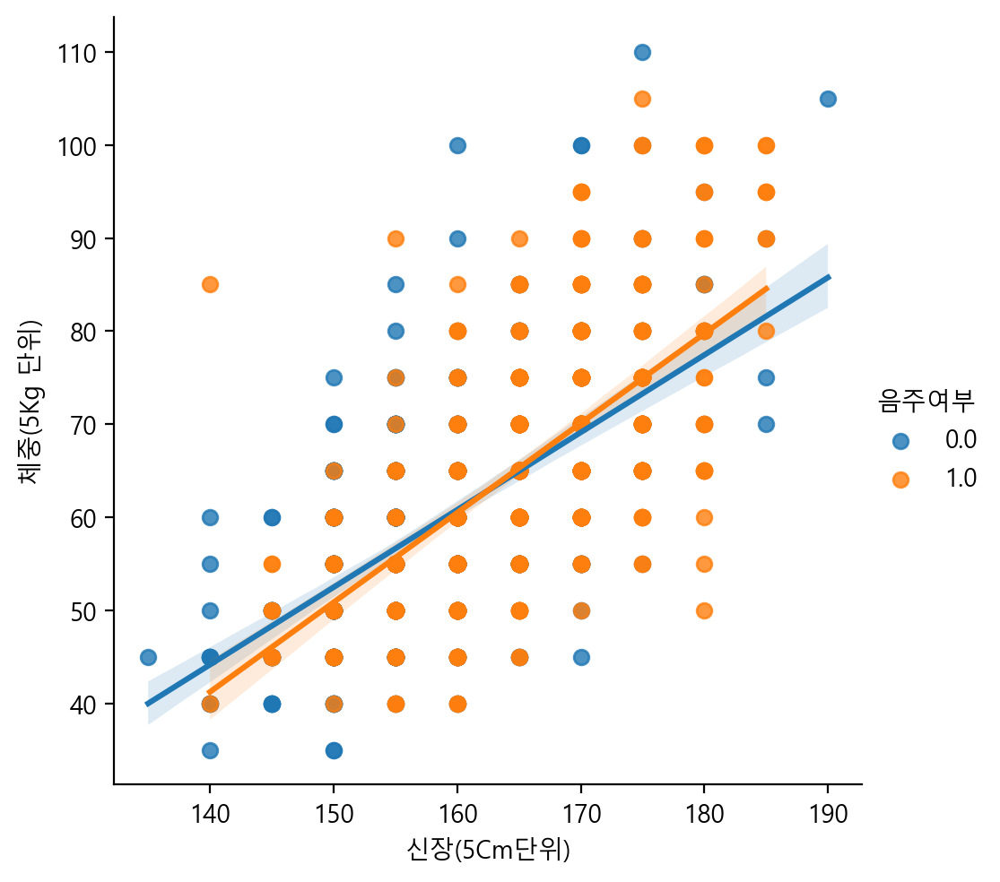

In [86]:
sns.lmplot(data=df_sample, x="신장(5Cm단위)", y="체중(5Kg 단위)", hue="음주여부")

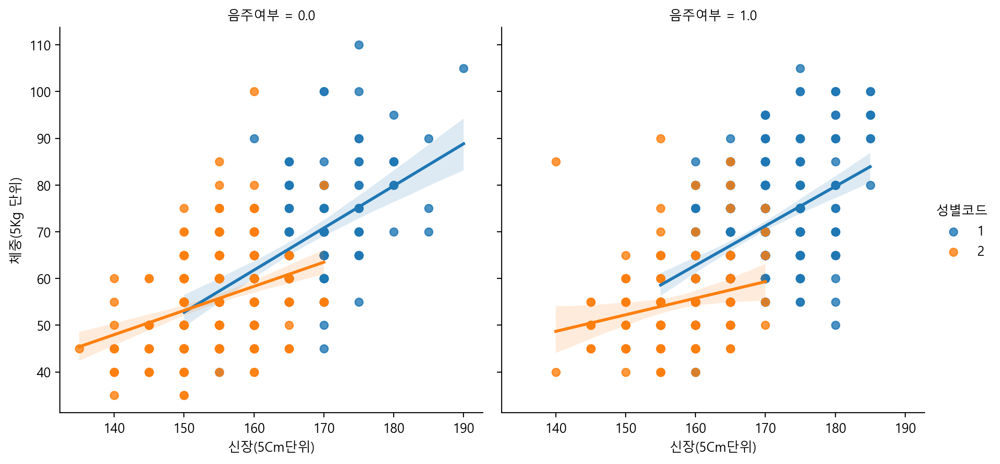

In [87]:
# 여러 카테고리 값에 따라 subplot을 그릴 수 있음 (hue: 다른 색상, col: 다른 그래프)
# 음주여부로 subplot 생성
sns.lmplot(data=df_sample, x="신장(5Cm단위)", y="체중(5Kg 단위)", hue="성별코드", col="음주여부")

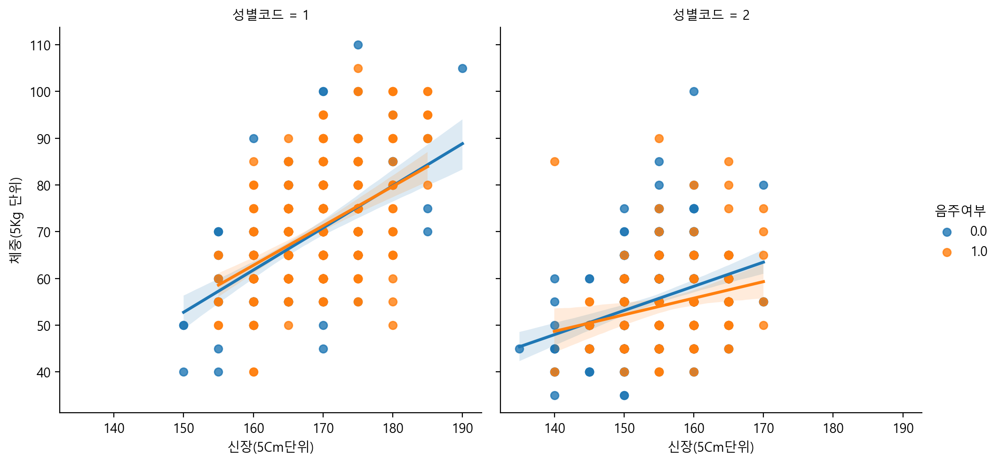

In [88]:
# 성별코드에 따라 subplot 생성
sns.lmplot(data=df_sample, x="신장(5Cm단위)", y="체중(5Kg 단위)", hue="음주여부", col="성별코드")

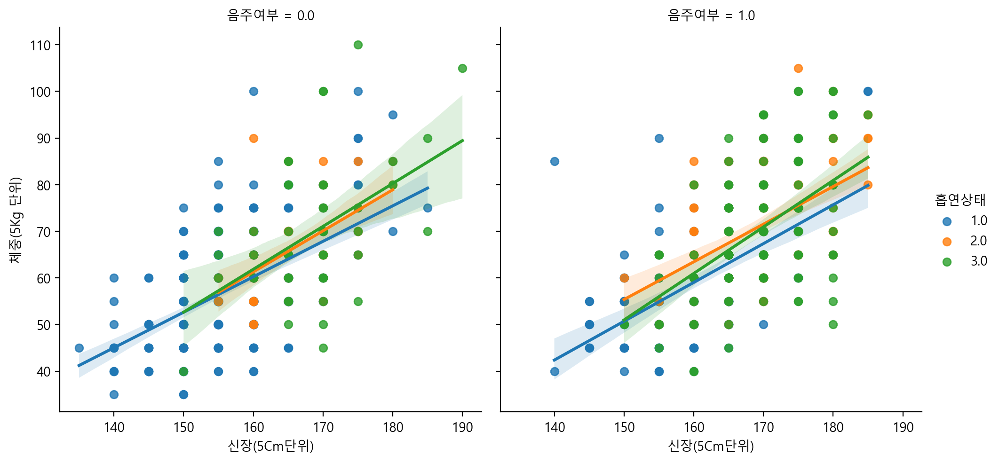

In [89]:
sns.lmplot(data=df_sample, x="신장(5Cm단위)", y="체중(5Kg 단위)", hue="흡연상태", col="음주여부")

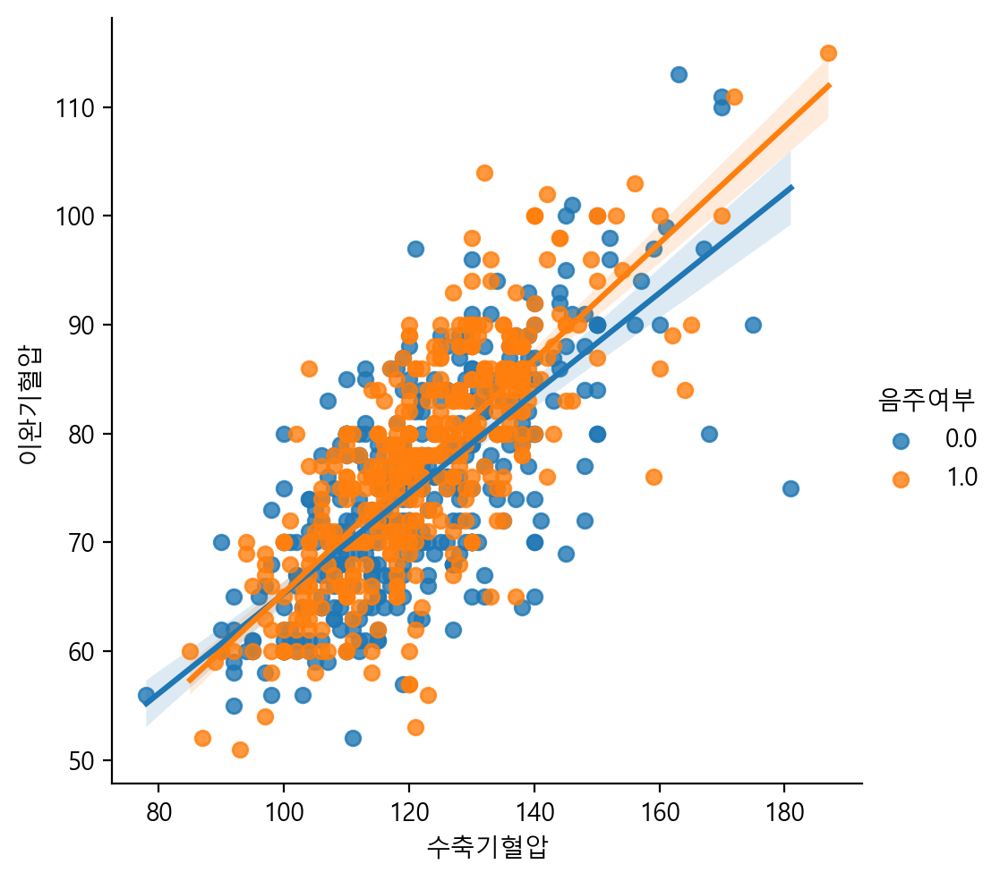

In [90]:
# 음주여부에 따른 건강검진 수치
sns.lmplot(data=df_sample, x="수축기혈압", y="이완기혈압", hue="음주여부")

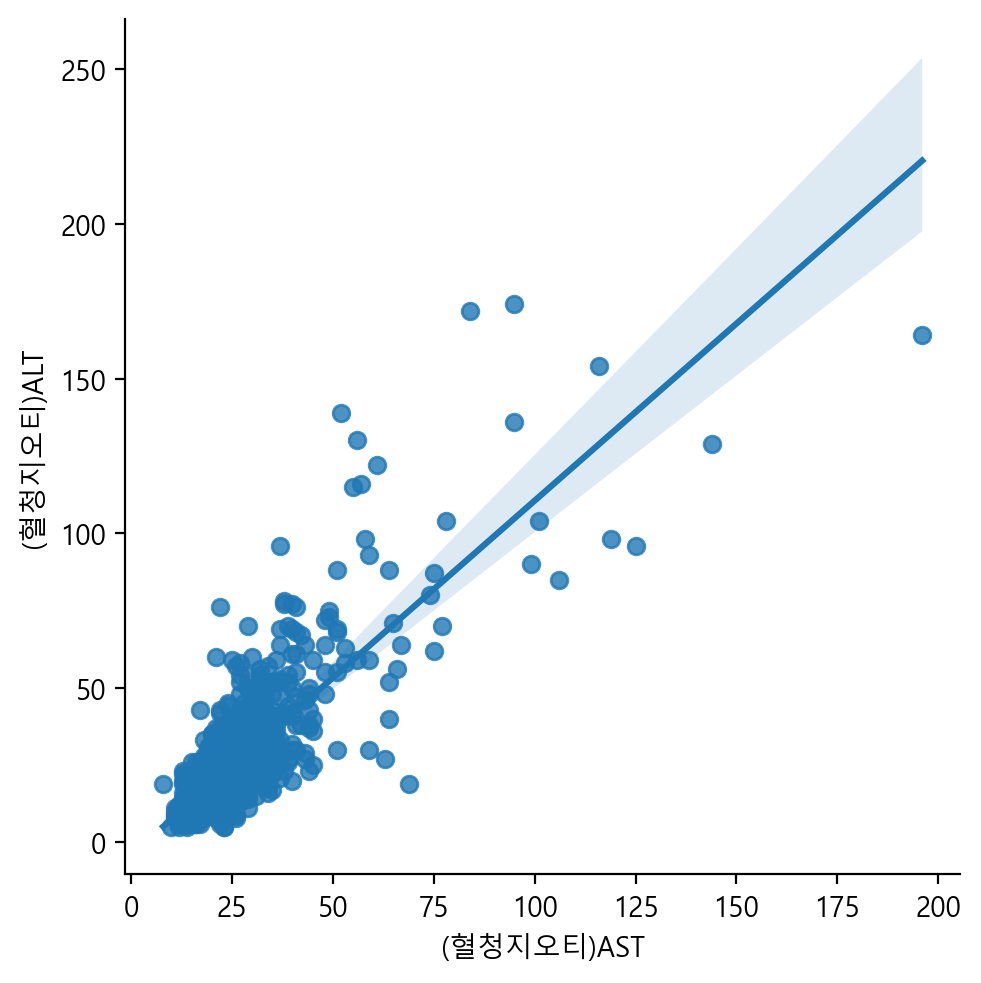

In [91]:
# 두 특성은 강한 상관관계를 보임
sns.lmplot(data=df_sample, x="(혈청지오티)AST", y="(혈청지오티)ALT")

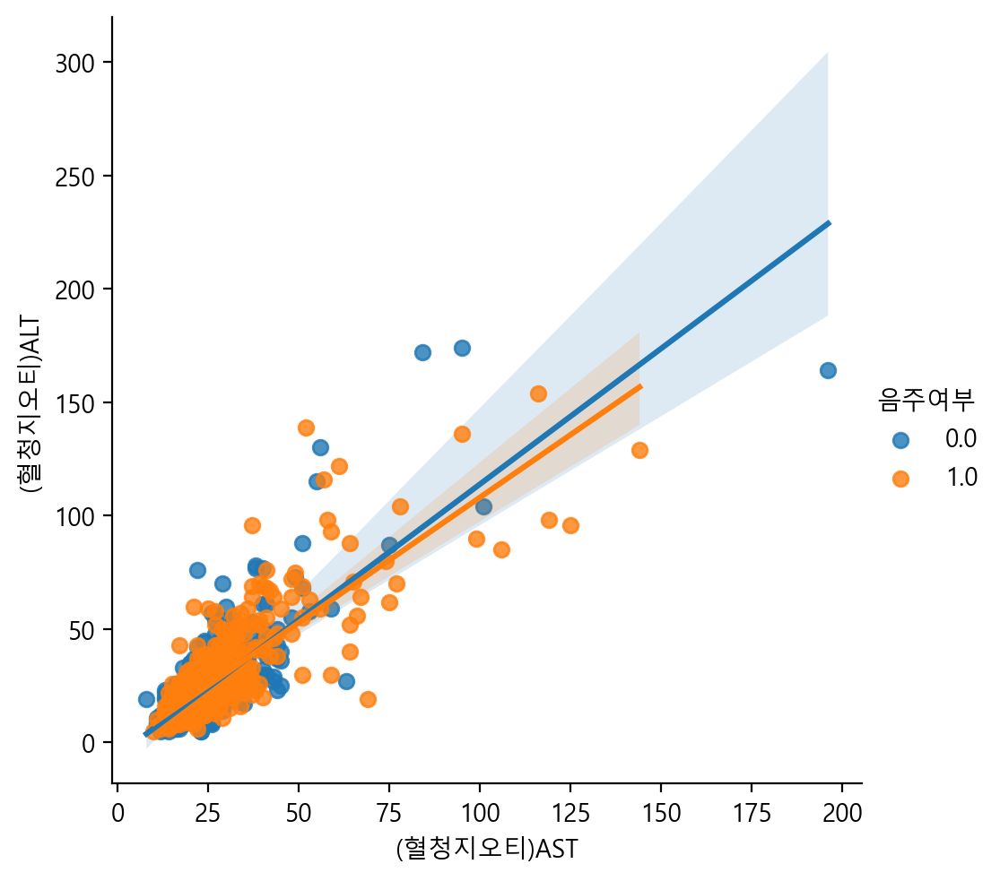

In [92]:
# 이상치 확인 가능
sns.lmplot(data=df_sample, x="(혈청지오티)AST", y="(혈청지오티)ALT", hue="음주여부")

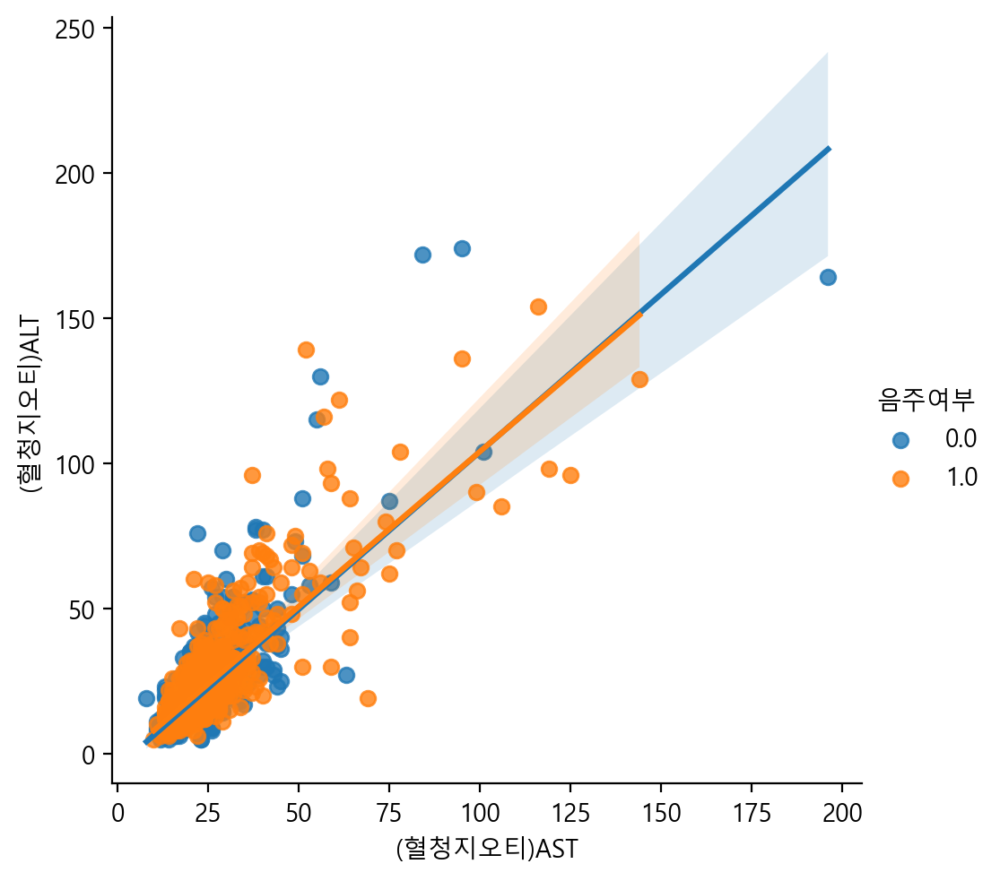

In [93]:
# robust: 이상치를 제외하고 그래프 그림
# 이상치가 있으면 회귀선이 영향을 많이 받으므로 robust 옵션을 사용해주는 것이 좋다
sns.lmplot(data=df_sample, x="(혈청지오티)AST", y="(혈청지오티)ALT", hue="음주여부", robust=True)

#### 이상치 다루기

In [95]:
# 범위를 지정해 데이터셋 df_ASLT 만듦
df_ASLT = df_sample[(df_sample["(혈청지오티)AST"] < 400) & (df_sample["(혈청지오티)ALT"] < 400)]
df_ASLT

,기준년도,가입자일련번호,성별코드,연령대코드(5세단위),시도코드,신장(5Cm단위),체중(5Kg 단위),허리둘레,시력(좌),시력(우),...,감마지티피,흡연상태,음주여부,구강검진 수검여부,치아우식증유무,결손치유무,치아마모증유무,제3대구치(사랑니)이상,치석,데이터공개일자
276826,2017,276827,2,12,11,155.0,85.0,113.0,0.7,1.0,...,35.0,1.0,0.0,0,NaN,NaN,NaN,NaN,NaN,20181126
849425,2017,849426,2,15,11,155.0,45.0,73.0,0.5,0.4,...,19.0,1.0,0.0,1,NaN,NaN,NaN,NaN,0.0,20181126
504499,2017,504500,1,11,47,170.0,45.0,63.0,0.7,0.4,...,15.0,3.0,0.0,0,NaN,NaN,NaN,NaN,NaN,20181126
601054,2017,601055,2,16,26,150.0,50.0,77.0,0.4,0.3,...,13.0,1.0,0.0,0,NaN,NaN,NaN,NaN,NaN,20181126
980221,2017,980222,2,13,41,150.0,65.0,95.0,1.0,0.8,...,265.0,1.0,0.0,0,NaN,NaN,NaN,NaN,NaN,20181126
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
890013,2017,890014,2,11,29,155.0,50.0,65.1,1.0,0.8,...,22.0,2.0,1.0,1,NaN,NaN,NaN,NaN,1.0,20181126
875389,2017,875390,2,9,11,155.0,45.0,66.5,0.9,0.8,...,12.0,1.0,1.0,1,NaN,NaN,NaN,NaN,0.0,20181126
358458,2017,358459,2,11,11,160.0,50.0,72.0,0.9,0.8,...,11.0,1.0,0.0,0,NaN,NaN,NaN,NaN,NaN,20181126
808228,2017,808229,1,9,48,175.0,65.0,75.2,1.2,1.2,...,122.0,3.0,1.0,1,NaN,NaN,NaN,NaN,0.0,20181126


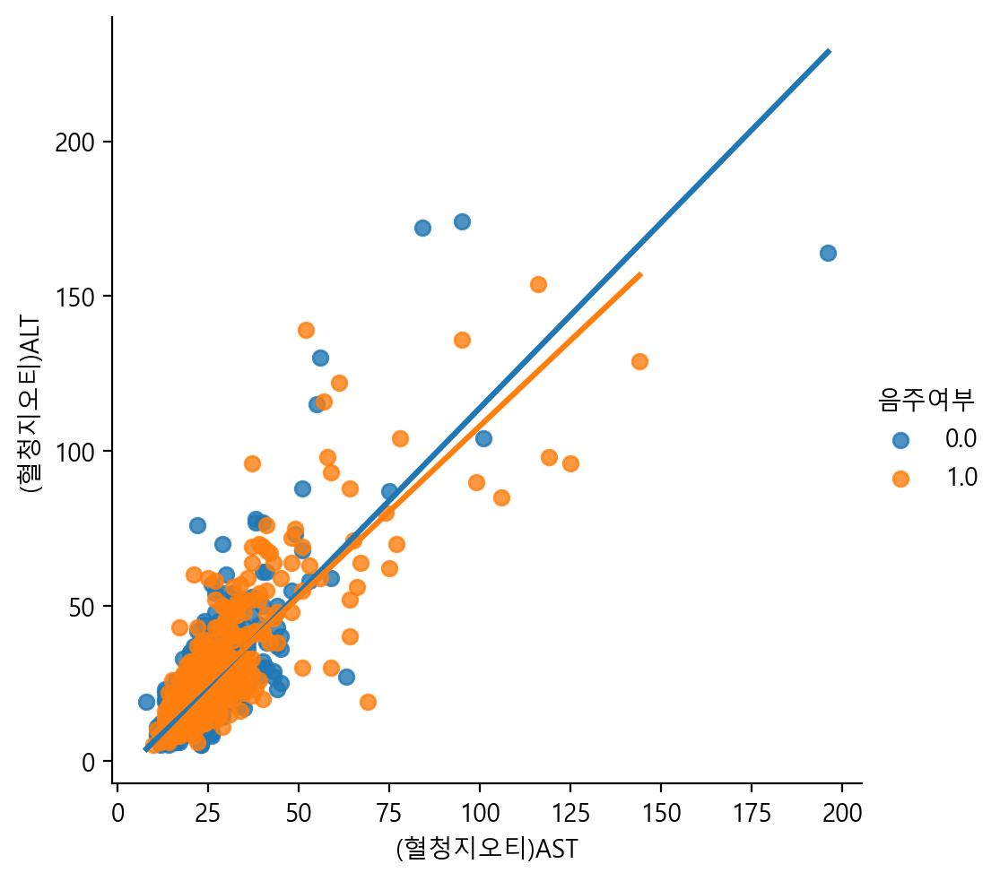

In [181]:
# 범위를 지정하면 그래프 그리는데에 시간이 짧아짐
sns.lmplot(data=df_ASLT, x="(혈청지오티)AST", y="(혈청지오티)ALT", hue="음주여부", ci=None)

In [191]:
# AST와 ALT의 이상치들만 모은 데이터
df_ASLT_high = df_sample[(df["(혈청지오티)AST"]>400)|(df["(혈청지오티)ALT"]>400)]
df_ASLT_high

C:\Users\70160\AppData\Local\Temp\ipykernel_6740\620469993.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_ASLT_high = df_sample[(df["(혈청지오티)AST"]>400)|(df["(혈청지오티)ALT"]>400)]


,기준년도,가입자일련번호,성별코드,연령대코드(5세단위),시도코드,신장(5Cm단위),체중(5Kg 단위),허리둘레,시력(좌),시력(우),...,감마지티피,흡연상태,음주여부,구강검진 수검여부,치아우식증유무,결손치유무,치아마모증유무,제3대구치(사랑니)이상,치석,데이터공개일자


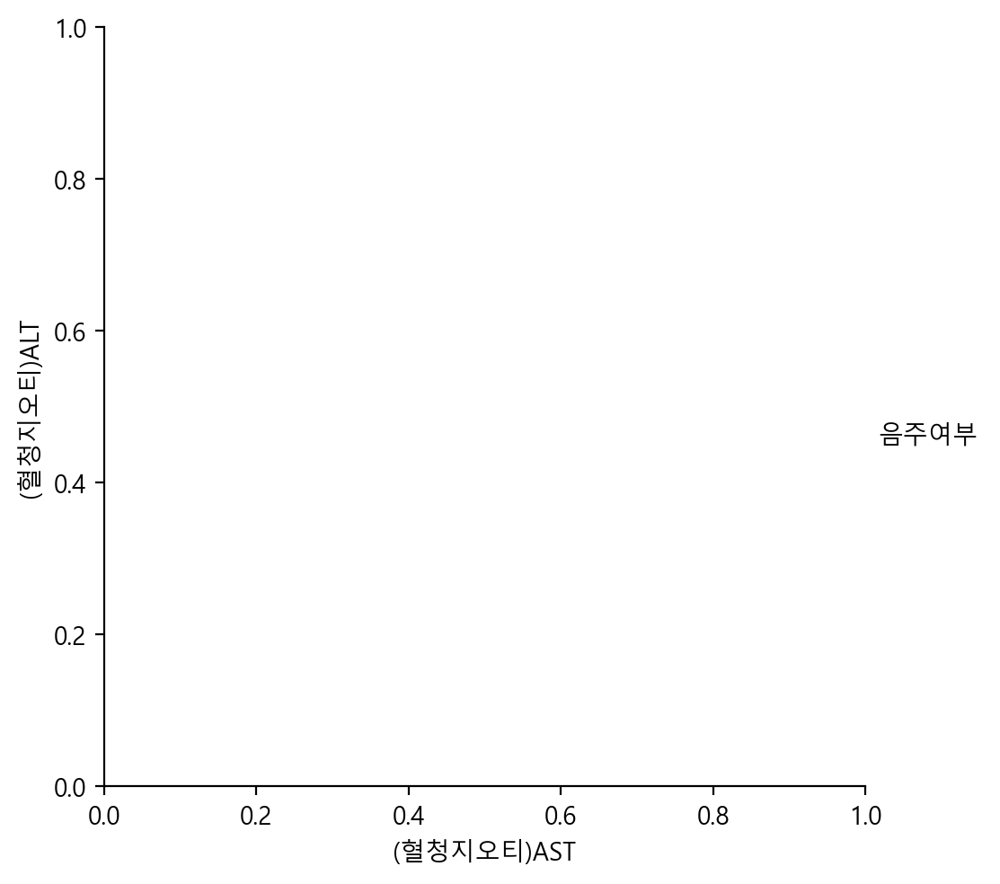

In [195]:
# 음주여부로 나누어 확인
sns.lmplot(data=df_ASLT_high, x="(혈청지오티)AST", y="(혈청지오티)ALT", hue="음주여부", ci=None)

In [197]:
# 특정 column에 따라 이상치 따로 확인 가능
df_ASLT_high_8000 = df_ASLT_high[df_ASLT_high["(혈청지오티)AST"] > 8000]
df_ASLT_high_8000.iloc[:, 10:27]

,청력(좌),청력(우),수축기혈압,이완기혈압,식전혈당(공복혈당),총콜레스테롤,트리글리세라이드,HDL콜레스테롤,LDL콜레스테롤,혈색소,요단백,혈청크레아티닌,(혈청지오티)AST,(혈청지오티)ALT,감마지티피,흡연상태,음주여부


### 수치형 데이터의 분포를 표현하기 - distplot
 * scatterplot은 x, y가 모두 수치형 데이터일 때 그릴 수 있습니다.
 * distplot은 히스토그램을 그려줍니다. 히스토그램: 도수분포표에 따라 그림을 그리는 것, 계급에 따라 데이터의 개수를 세주는 것
 * displot은 결측치가 있으면 그릴 수 없다


In [206]:
# df_chol에 결측치가 아닌(notnull) 총콜레스테롤값 넣어줌
df_chol = df.loc[df["총콜레스테롤"].notnull(), "총콜레스테롤"]
df_chol.head()

0    178.0
1    255.0
2    211.0
3    160.0
4    253.0
Name: 총콜레스테롤, dtype: float64

C:\Users\70160\AppData\Local\Temp\ipykernel_6740\959284361.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_chol)


<Axes: xlabel='총콜레스테롤', ylabel='Density'>

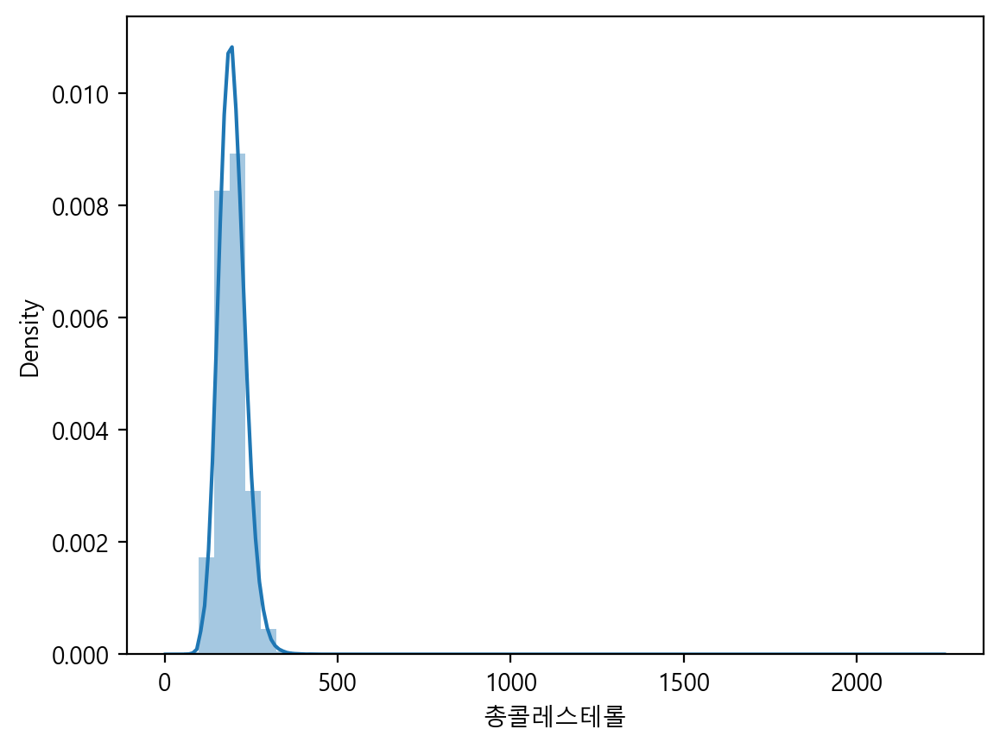

In [208]:
# 총콜레스테롤을 부드러운 곡선과 막대로 표현
# 히스토그램은 막대를 나타내고, 히스토그램을 부드러운 곡선으로 처리해주는 것이 확률밀도함수
# 왜도와 첨도도 확인 가능
sns.distplot(df_chol)

C:\Users\70160\AppData\Local\Temp\ipykernel_6740\665465042.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_chol, bins=10)


<Axes: xlabel='총콜레스테롤', ylabel='Density'>

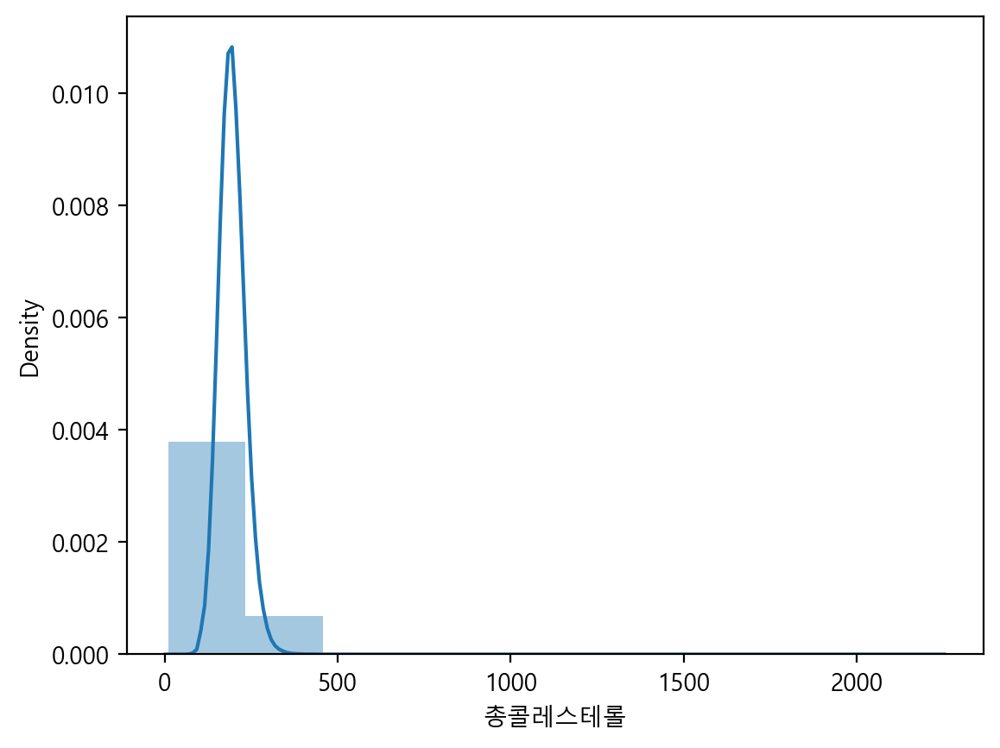

In [210]:
# bin으로 데이터를 몇 개로 나눠 담을지 설정 가능
# 이상치 때문에 그래프가 한 쪽으로 몰려있음
sns.distplot(df_chol, bins=10)

In [212]:
# 음주를 하는 사람들의 총콜레스테롤 데이터
df[df["총콜레스테롤"].notnull() & (df["음주여부"] == 1)]

,기준년도,가입자일련번호,성별코드,연령대코드(5세단위),시도코드,신장(5Cm단위),체중(5Kg 단위),허리둘레,시력(좌),시력(우),...,감마지티피,흡연상태,음주여부,구강검진 수검여부,치아우식증유무,결손치유무,치아마모증유무,제3대구치(사랑니)이상,치석,데이터공개일자
3,2017,4,2,12,11,155.0,55.0,67.5,0.9,1.0,...,30.0,1.0,1.0,0,NaN,NaN,NaN,NaN,NaN,20181126
5,2017,6,1,8,11,170.0,70.0,84.8,1.2,1.0,...,33.0,2.0,1.0,1,NaN,NaN,NaN,NaN,1.0,20181126
6,2017,7,1,8,48,175.0,110.0,111.5,1.0,1.0,...,45.0,3.0,1.0,0,NaN,NaN,NaN,NaN,NaN,20181126
9,2017,10,1,8,11,170.0,70.0,86.0,1.0,1.0,...,88.0,1.0,1.0,1,NaN,NaN,NaN,NaN,0.0,20181126
18,2017,19,1,8,30,175.0,80.0,88.0,0.8,0.8,...,18.0,2.0,1.0,1,NaN,NaN,NaN,NaN,0.0,20181126
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
999992,2017,999993,2,5,30,160.0,50.0,68.1,1.0,1.0,...,15.0,3.0,1.0,1,NaN,NaN,NaN,NaN,1.0,20181126
999993,2017,999994,1,8,47,175.0,95.0,88.0,1.2,1.5,...,93.0,3.0,1.0,0,NaN,NaN,NaN,NaN,NaN,20181126
999994,2017,999995,1,10,41,165.0,85.0,98.0,0.7,0.9,...,66.0,3.0,1.0,0,NaN,NaN,NaN,NaN,NaN,20181126
999995,2017,999996,2,9,41,165.0,55.0,70.0,1.5,1.5,...,11.0,1.0,1.0,0,NaN,NaN,NaN,NaN,NaN,20181126


C:\Users\70160\AppData\Local\Temp\ipykernel_6740\1479522818.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df.loc[(df["총콜레스테롤"].notnull()) & (df["음주여부"] == 1), "총콜레스테롤"])


<Axes: xlabel='총콜레스테롤', ylabel='Density'>

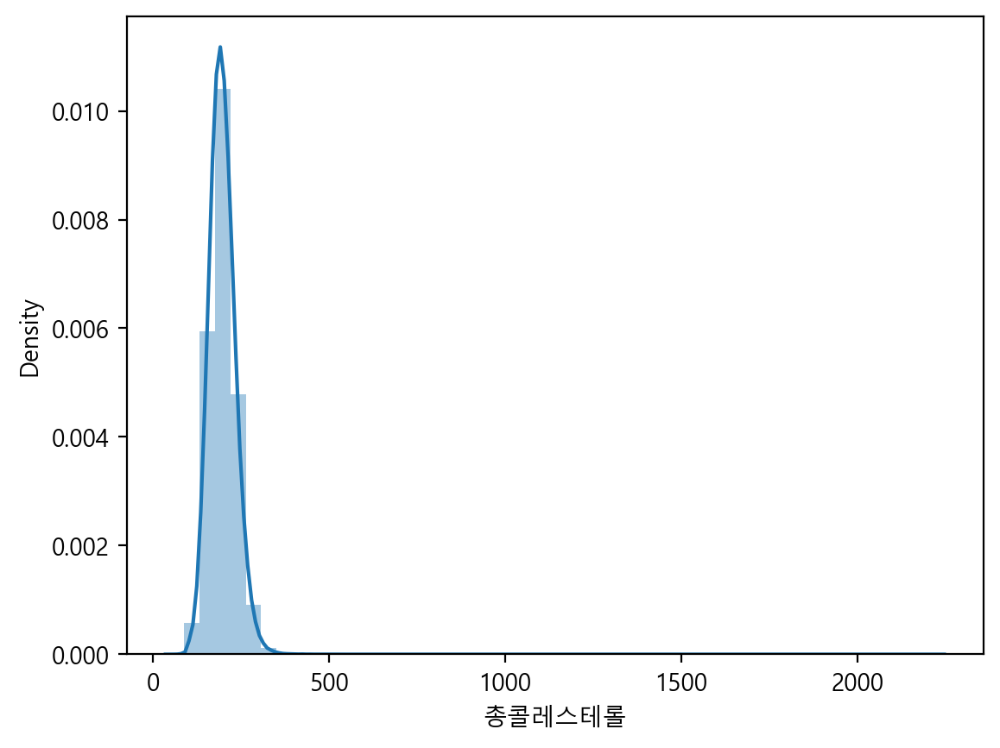

In [220]:
# distplot은 series 데이터를 넣어줘야 함
# 위의 데이터의 총콜레스테롤 분포를 나타냄
sns.distplot(df.loc[(df["총콜레스테롤"].notnull()) & (df["음주여부"] == 1), "총콜레스테롤"])

C:\Users\70160\AppData\Local\Temp\ipykernel_6740\3851739372.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df.loc[(df["총콜레스테롤"].notnull()) & (df["음주여부"] == 0), "총콜레스테롤"])


<Axes: xlabel='총콜레스테롤', ylabel='Density'>

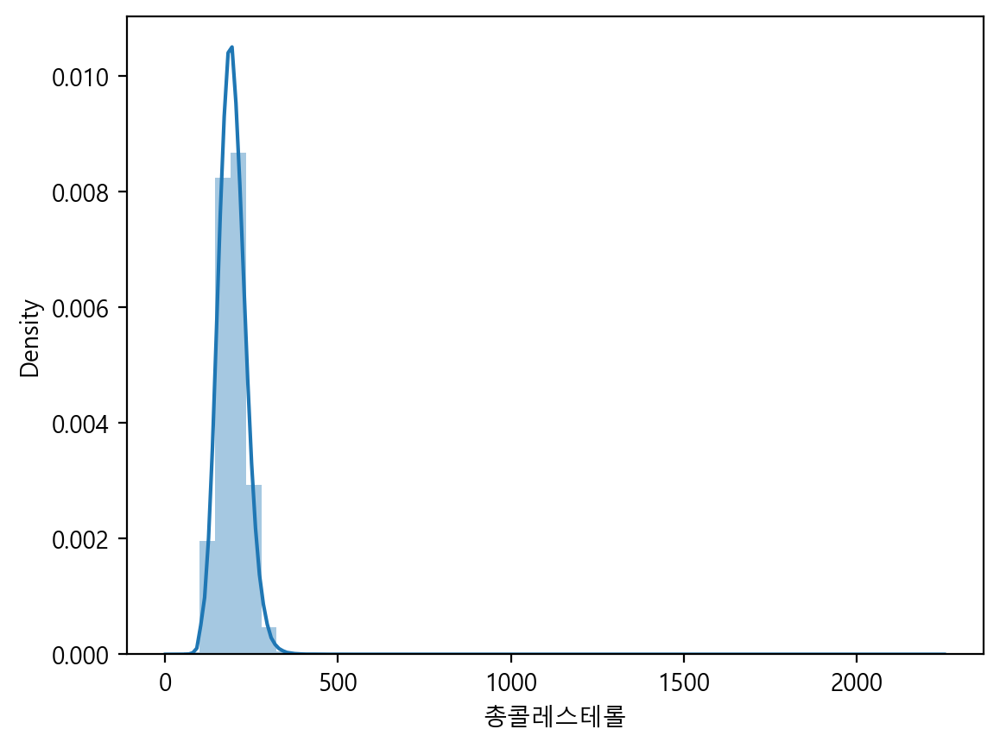

In [218]:
# 음주여부가 0인 사람들의 총콜레스테롤 분포
sns.distplot(df.loc[(df["총콜레스테롤"].notnull()) & (df["음주여부"] == 0), "총콜레스테롤"])

C:\Users\70160\AppData\Local\Temp\ipykernel_6740\3884398774.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df.loc[(df["총콜레스테롤"].notnull()) & (df["음주여부"] == 1), "총콜레스테롤"], hist=False)
C:\Users\70160\AppData\Local\Temp\ipykernel_6740\3884398774.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  

<Axes: xlabel='총콜레스테롤', ylabel='Density'>

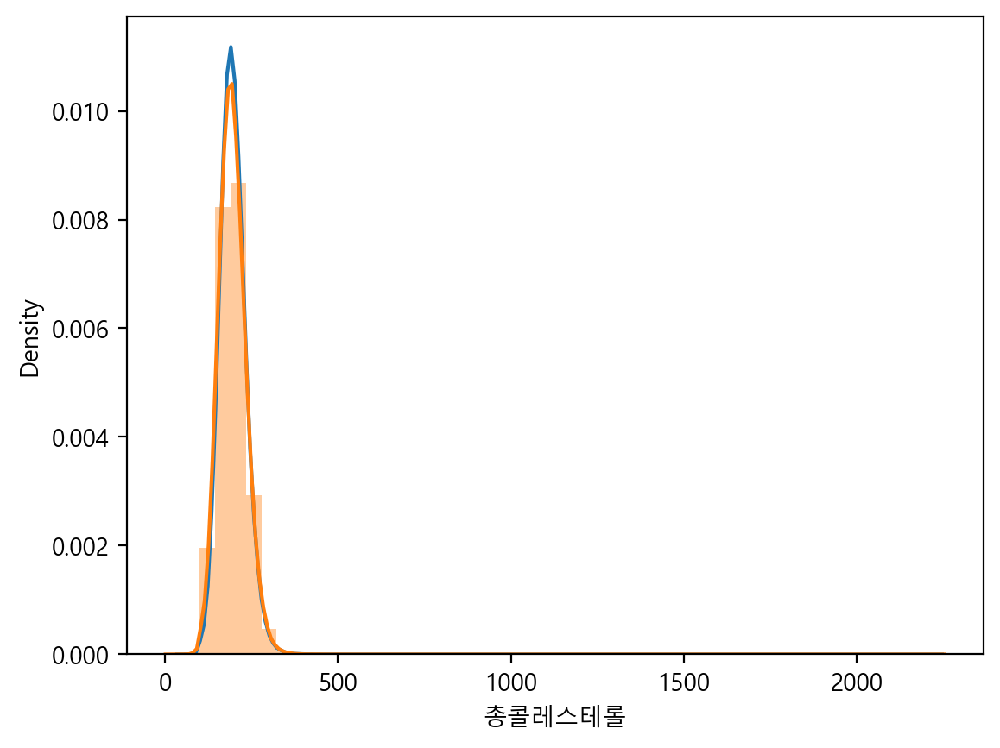

In [222]:
# 두개의 그래프를 같이 표시
# hist=False로 설정하면 선만 나옴
sns.distplot(df.loc[(df["총콜레스테롤"].notnull()) & (df["음주여부"] == 1), "총콜레스테롤"], hist=False)
sns.distplot(df.loc[(df["총콜레스테롤"].notnull()) & (df["음주여부"] == 0), "총콜레스테롤"])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


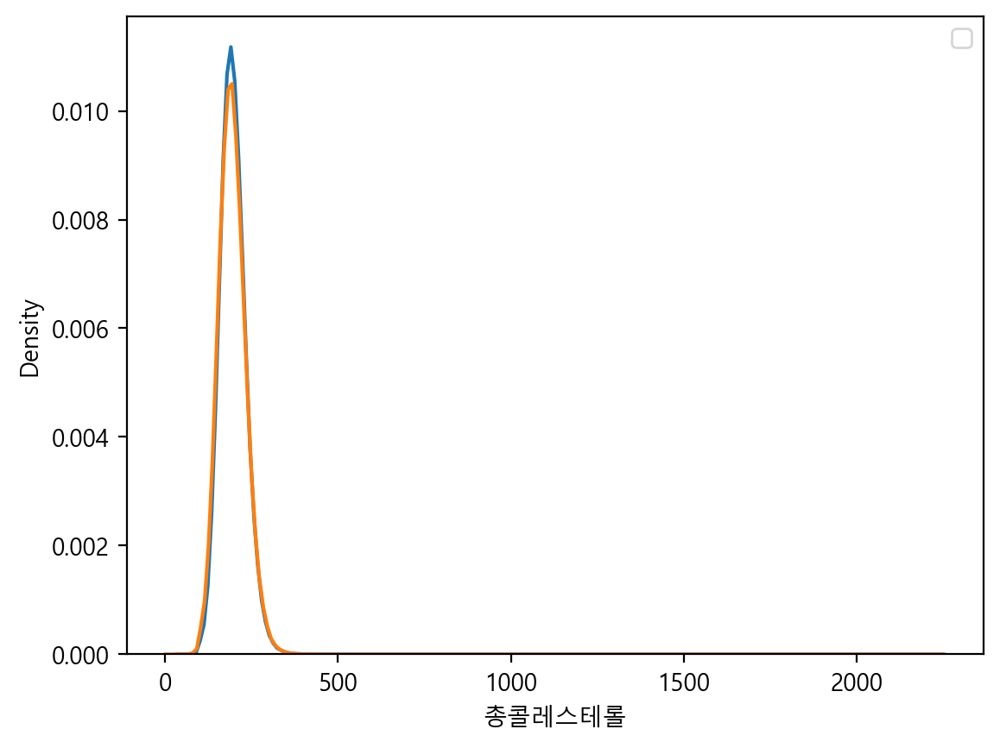

In [237]:
# kdeplot: 확률밀도함수만 그림
sns.kdeplot(df.loc[(df["총콜레스테롤"].notnull()) & (df["음주여부"] == 1), "총콜레스테롤"])
sns.kdeplot(df.loc[(df["총콜레스테롤"].notnull()) & (df["음주여부"] == 0), "총콜레스테롤"])

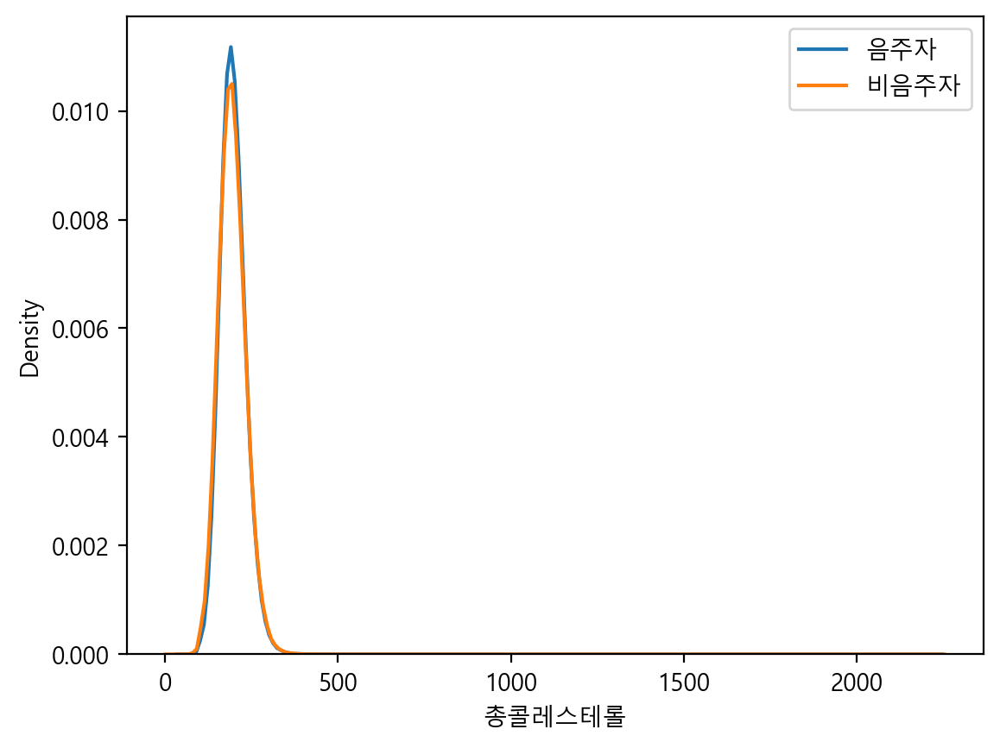

In [239]:
# label: 각 그래프가 어떤 데이터를 갖고있는지 설명
sns.kdeplot(df.loc[(df["총콜레스테롤"].notnull()) & (df["음주여부"] == 1), "총콜레스테롤"], label="음주자")
sns.kdeplot(df.loc[(df["총콜레스테롤"].notnull()) & (df["음주여부"] == 0), "총콜레스테롤"], label="비음주자")

# label 표시
plt.legend()
plt.show()

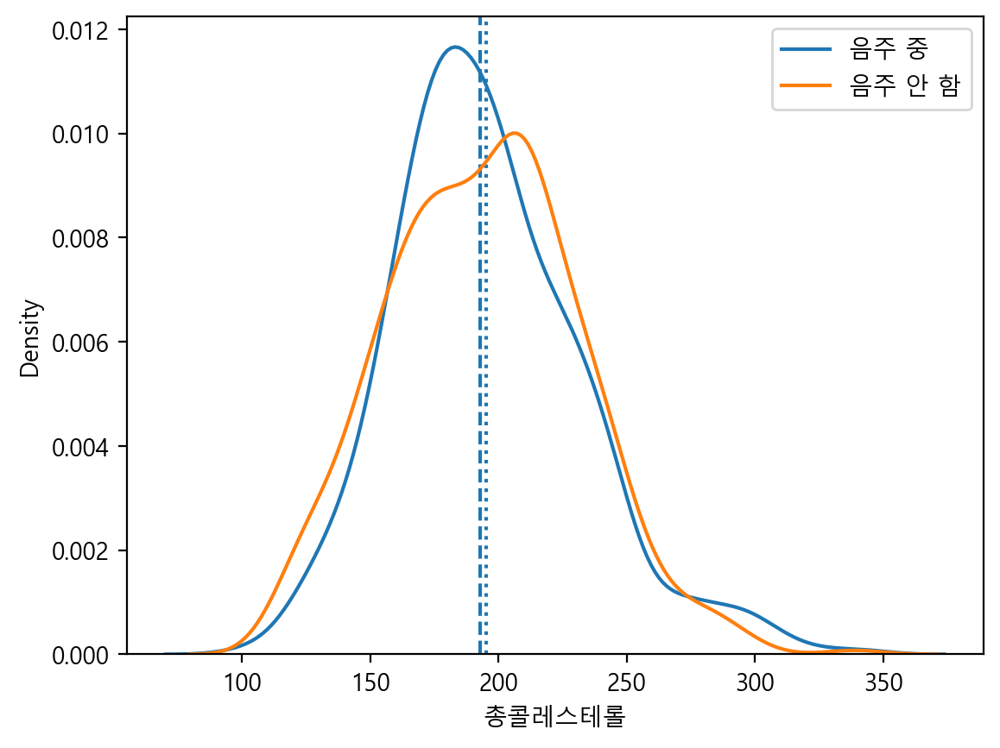

In [243]:
# plt.axvline()을 사용하여 그래프에 평균값과 중앙값 선을 그릴 수 있음
plt.axvline(df_sample["총콜레스테롤"].mean(), linestyle=":")
plt.axvline(df_sample["총콜레스테롤"].median(), linestyle="--")
sns.kdeplot(df_sample.loc[(df_sample["총콜레스테롤"].notnull()) & (df["음주여부"] == 1), "총콜레스테롤"], label="음주 중")
sns.kdeplot(df_sample.loc[(df_sample["총콜레스테롤"].notnull()) & (df["음주여부"] == 0), "총콜레스테롤"], label="음주 안 함")
plt.legend()
plt.show()

C:\Users\70160\AppData\Local\Temp\ipykernel_6740\2809722175.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(s_1, label="음주 중")
C:\Users\70160\AppData\Local\Temp\ipykernel_6740\2809722175.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(s_0, label="음주 중")


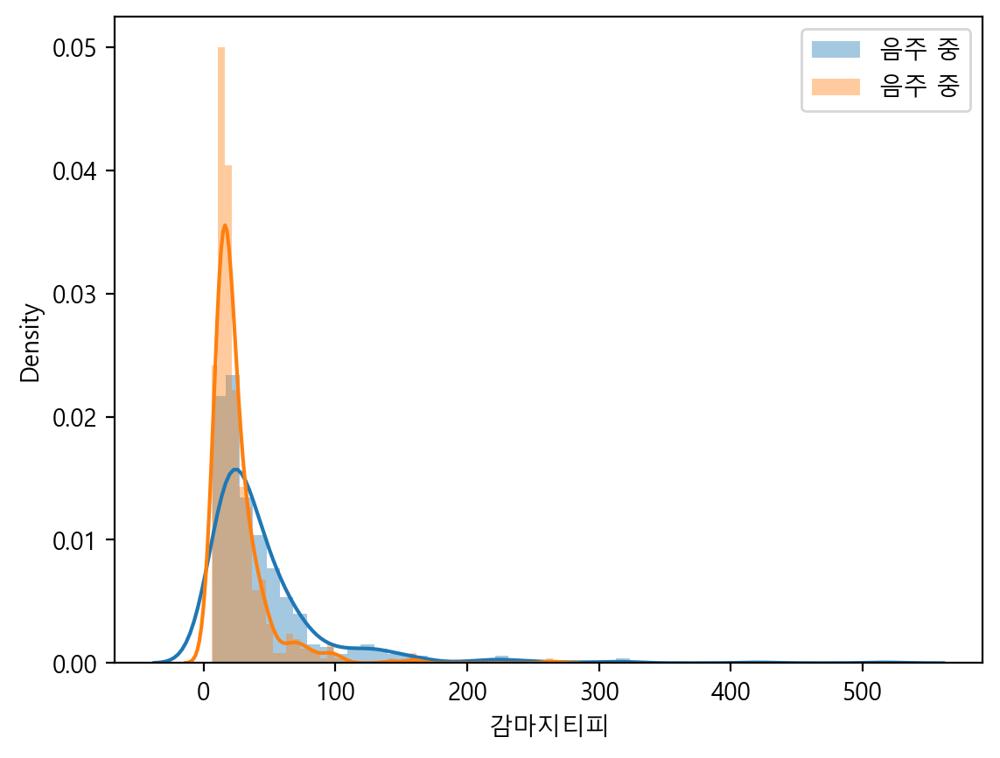

In [249]:
# 음주 여부에 따른 "감마지티피"를 확인
s_1 = df_sample.loc[df_sample["음주여부"] == 1, "감마지티피"]
s_0 = df_sample.loc[df_sample["음주여부"] == 0, "감마지티피"]

sns.distplot(s_1, label="음주 중")
sns.distplot(s_0, label="음주 중")

plt.legend()
plt.show()

### 상관계수 - heatmap 으로 표현하기
#### 상관계수
 * 상관계수는 변수들 간의 관계를 알아볼 때 유용한 개념입니다. 특정 데이터에 대한 상관관계를 볼 수 있습니다. (연관정도 파악, 인과관계X)
 * 상관계수는 -1부터 1사이로 구성되고, 0.3부터 0.7 사이면 뚜렷한 양적 선형관계, 0.7 이상이면 강한 양적 상관관계라 할 수 있습니다.

In [264]:
# 우선 columns 변수 안에 상관계수에 사용할 컬럼들을 담습니다.
columns = ['연령대코드(5세단위)', '신장(5Cm단위)', '체중(5Kg 단위)', '허리둘레', '시력(좌)', '시력(우)', '청력(좌)', '청력(우)', '수축기혈압',
       '이완기혈압', '식전혈당(공복혈당)', '총콜레스테롤', '트리글리세라이드', 'HDL콜레스테롤', 'LDL콜레스테롤', '혈색소', '요단백', '혈청크레아티닌', 
           '(혈청지오티)AST', '(혈청지오티)ALT', '감마지티피', '흡연상태', '음주여부']
columns

['연령대코드(5세단위)',
 '신장(5Cm단위)',
 '체중(5Kg 단위)',
 '허리둘레',
 '시력(좌)',
 '시력(우)',
 '청력(좌)',
 '청력(우)',
 '수축기혈압',
 '이완기혈압',
 '식전혈당(공복혈당)',
 '총콜레스테롤',
 '트리글리세라이드',
 'HDL콜레스테롤',
 'LDL콜레스테롤',
 '혈색소',
 '요단백',
 '혈청크레아티닌',
 '(혈청지오티)AST',
 '(혈청지오티)ALT',
 '감마지티피',
 '흡연상태',
 '음주여부']

In [288]:
# corr(): 피어슨 상관계수로 상관계수 계산
# 상관계수를 계산할 때 대각선이 1인 이유는 자기자신과 가장 관계가 있기 때문
# -는 음의 상관관계이고, +는 양의 상관관계, 0에 가까우면 상관관계X
df_small = df_sample[columns]
df_corr = df_small.corr()
df_corr

,연령대코드(5세단위),신장(5Cm단위),체중(5Kg 단위),허리둘레,시력(좌),시력(우),청력(좌),청력(우),수축기혈압,이완기혈압,...,HDL콜레스테롤,LDL콜레스테롤,혈색소,요단백,혈청크레아티닌,(혈청지오티)AST,(혈청지오티)ALT,감마지티피,흡연상태,음주여부
연령대코드(5세단위),1.000000,-0.397412,-0.210610,0.134720,-0.201947,-0.203802,0.193769,0.253585,0.296807,0.149758,...,-0.121635,0.023206,-0.165788,-0.022885,0.020587,0.106376,-0.014101,0.052946,-0.136350,-0.277149
신장(5Cm단위),-0.397412,1.000000,0.648489,0.293774,0.141800,0.156605,-0.100178,-0.121083,0.030012,0.118103,...,-0.152505,-0.003485,0.529475,0.014089,0.243101,0.035321,0.187945,0.171372,0.505945,0.362905
체중(5Kg 단위),-0.210610,0.648489,1.000000,0.790520,0.076534,0.133502,-0.038100,-0.070590,0.244673,0.287084,...,-0.357603,0.106049,0.508366,0.028840,0.190769,0.196722,0.372930,0.254150,0.397230,0.235974
허리둘레,0.134720,0.293774,0.790520,1.000000,-0.033007,0.034518,0.048379,0.052245,0.333025,0.302398,...,-0.409940,0.098301,0.377023,-0.002252,0.149351,0.229202,0.357288,0.271566,0.268685,0.084514
시력(좌),-0.201947,0.141800,0.076534,-0.033007,1.000000,0.462877,-0.049368,-0.084603,-0.010112,-0.001695,...,0.021295,-0.015221,0.073866,0.010995,0.018104,0.003379,0.029429,0.011519,0.063964,0.073696
시력(우),-0.203802,0.156605,0.133502,0.034518,0.462877,1.000000,-0.041439,-0.096255,-0.020638,0.012802,...,-0.030666,0.044949,0.056753,0.009548,0.031835,0.024706,0.083163,0.045560,0.054681,0.063220
청력(좌),0.193769,-0.100178,-0.038100,0.048379,-0.049368,-0.041439,1.000000,0.512849,0.105602,0.034535,...,-0.015340,-0.018551,-0.015990,-0.026771,-0.026352,0.014587,0.003031,-0.006351,-0.034204,-0.037669
청력(우),0.253585,-0.121083,-0.070590,0.052245,-0.084603,-0.096255,0.512849,1.000000,0.127883,0.041907,...,-0.078820,-0.059298,-0.031084,-0.013656,-0.030057,0.002233,-0.023672,0.005842,-0.040937,-0.032475
수축기혈압,0.296807,0.030012,0.244673,0.333025,-0.010112,-0.020638,0.105602,0.127883,1.000000,0.744132,...,-0.138843,0.003982,0.143038,0.016896,0.090268,0.143089,0.118240,0.176208,0.108511,0.032543
이완기혈압,0.149758,0.118103,0.287084,0.302398,-0.001695,0.012802,0.034535,0.041907,0.744132,1.000000,...,-0.090783,0.045014,0.219912,0.021567,0.131162,0.159043,0.154490,0.204673,0.144251,0.110143


In [272]:
df_corr["신장(5Cm단위)"].sort_values()

연령대코드(5세단위)   -0.397412
HDL콜레스테롤      -0.152505
청력(우)         -0.121083
청력(좌)         -0.100178
총콜레스테롤        -0.013813
LDL콜레스테롤      -0.003485
요단백            0.014089
수축기혈압          0.030012
(혈청지오티)AST     0.035321
식전혈당(공복혈당)     0.059881
트리글리세라이드       0.113687
이완기혈압          0.118103
시력(좌)          0.141800
시력(우)          0.156605
감마지티피          0.171372
(혈청지오티)ALT     0.187945
혈청크레아티닌        0.243101
허리둘레           0.293774
음주여부           0.362905
흡연상태           0.505945
혈색소            0.529475
체중(5Kg 단위)     0.648489
신장(5Cm단위)      1.000000
Name: 신장(5Cm단위), dtype: float64

In [276]:
# 신장과의 상관계수가 0.3이상인 feature만 가져옴
df_corr.loc[df_corr["신장(5Cm단위)"] > 0.3, "신장(5Cm단위)"]

신장(5Cm단위)     1.000000
체중(5Kg 단위)    0.648489
혈색소           0.529475
흡연상태          0.505945
음주여부          0.362905
Name: 신장(5Cm단위), dtype: float64

In [278]:
# 음주여부와의 상관계수 계산
df_corr["음주여부"].sort_values()
df_corr.loc[df_corr["음주여부"] > 0.1, "음주여부"]
df_corr.loc[df_corr["음주여부"] > 0.25, "음주여부"]

신장(5Cm단위)    0.362905
혈색소          0.291863
감마지티피        0.250011
흡연상태         0.365642
음주여부         1.000000
Name: 음주여부, dtype: float64

In [280]:
# 혈색소와의 상관 계수를 내림차순으로 정렬
df_corr["혈색소"].sort_values(ascending=False).head(7)

혈색소           1.000000
신장(5Cm단위)     0.529475
체중(5Kg 단위)    0.508366
흡연상태          0.460010
허리둘레          0.377023
(혈청지오티)ALT    0.294575
음주여부          0.291863
Name: 혈색소, dtype: float64

In [282]:
df_corr["감마지티피"].sort_values(ascending=False).head(7)

감마지티피         1.000000
(혈청지오티)AST    0.525509
(혈청지오티)ALT    0.514197
트리글리세라이드      0.335514
흡연상태          0.305811
식전혈당(공복혈당)    0.292087
허리둘레          0.271566
Name: 감마지티피, dtype: float64

<Axes: >

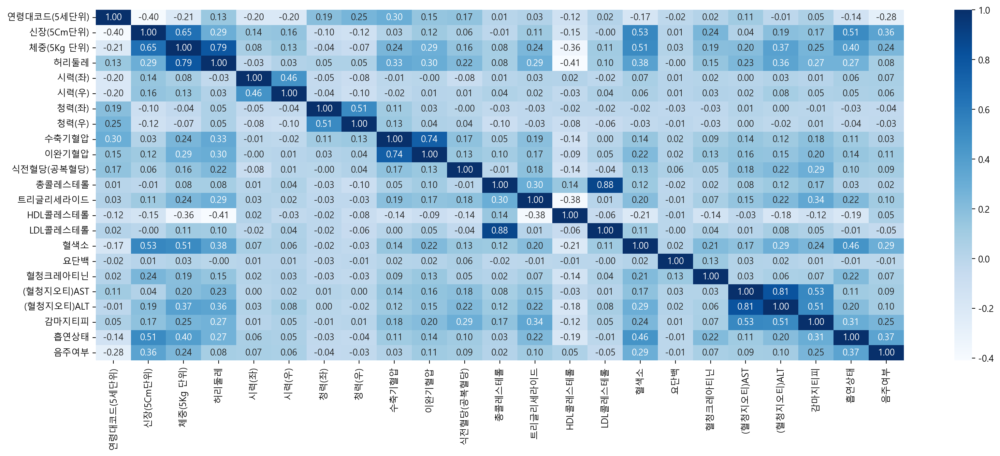

In [284]:
# 다른 그래프와 달리 heatmap은 바로 data만 넣어줍니다.
# 상관 관계가 클수록 값이 색이 진해집니다.
# annot: 숫자 나타냄, fmt: 소수점 갯수를 지정, cmap: 색상 지정
plt.figure(figsize=(20,7))
sns.heatmap(df_corr, annot=True, fmt=".2f", cmap="Blues")

<Axes: >

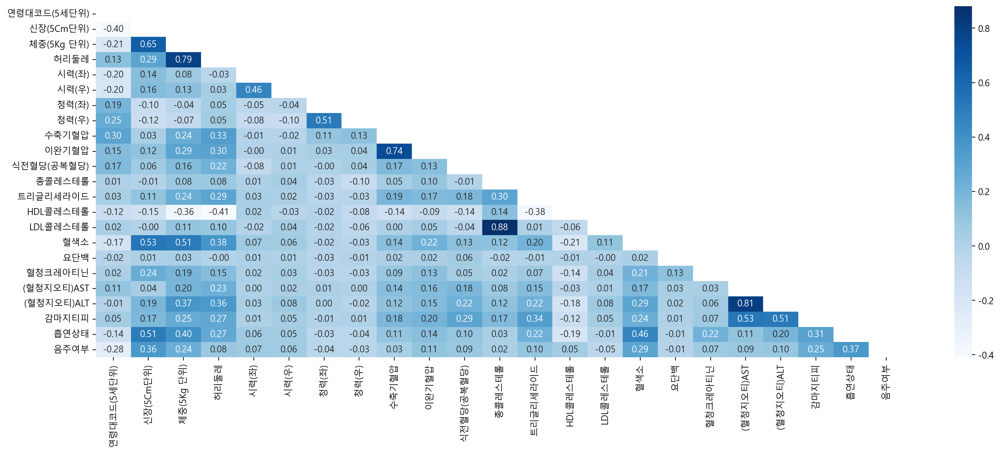

In [296]:
# mask: 매트릭스의 대각선 아래만 표시
mask = np.triu(np.ones_like(df_corr, dtype=bool))
plt.figure(figsize=(20, 7))
sns.heatmap(df_corr, annot=True, fmt=".2f", cmap="Blues", mask=mask)